In [1]:
library(miloR)
library(SingleCellExperiment)
library(scater)
library(dplyr)
library(patchwork)
library(data.table)
library(scales)

Loading required package: edgeR

Loading required package: limma

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedi

In [2]:
library('ggplot2')
library('Cairo')
CairoFonts(
regular="Sans:style=Medium",
bold="Sans:style=Bold",
italic="Sans:style=Oblique",
bolditalic="Sans:style=BoldOblique")

In [3]:
options(repr.plot.width = 7, repr.plot.height = 7, repr.plot.res=150, repr.plot.pointsize=12)

In [4]:
figures_path = "/nfs/team205/vk8/scripts/scvi/SKM_analyses_rev1/figures/"
tables_path = "/nfs/team205/vk8/scripts/scvi/SKM_analyses_rev1/tables/"

In [5]:
sce = readRDS("/nfs/team205/vk8/processed_data/muscle/data_v3/updated_icm_snuclei/ICM_myonuclei_scvi1_dbrm_sce_2023-05-11.Rds")
sce = sce [, (sce$DonorID!='343B')]

In [6]:
length(unique(sce$SampleID))

[1] 20

In [7]:
avrg_nhd_size = length(unique(sce$SampleID))*3
print(avrg_nhd_size)

sce$Age_group = factor(sce$Age_group, levels = c("young", "old"))

milo_obj = Milo(sce)
milo_obj = buildGraph(milo_obj, k = 57, d = 30, reduced.dim = "X_scVI")
milo_obj = makeNhoods(milo_obj, prop = 0.1, k = 57, d=30, refined = TRUE, reduced_dims = "X_scVI")
nhds = plotNhoodSizeHist(milo_obj)
milo_obj = countCells(milo_obj, meta.data = as.data.frame(colData(milo_obj)), sample="SampleID")
head(nhoodCounts(milo_obj))
dim(nhoodCounts(milo_obj))
summary(rowSums(nhoodCounts(milo_obj)))

sample_order = colnames(nhoodCounts(milo_obj))

[1] 60


Constructing kNN graph with k:57

Checking valid object

Running refined sampling with reduced_dim

Checking meta.data validity

Counting cells in neighbourhoods

  [[ suppressing 20 column names ‘mus_SNuc7468111’, ‘5386STDY7600836’, ‘5386STDY7600837’ ... ]]



6 x 20 sparse Matrix of class "dgCMatrix"
                                                    
1  8  2 .  . . . 1 2 1 10 10  1 . 16 .  .  .  . 28 .
2 22  6 8 30 . . . 3 1  5  5 13 .  4 2 45  1  2  . .
3  .  2 2  4 . 2 5 7 .  2  4  5 3  . 1 22  3  8  . .
4  7 11 6  3 4 2 2 7 .  .  .  1 .  9 3 70  .  1  . .
5 26  8 9 32 . . 2 1 5  2  1  3 .  7 .  6  2  2  . .
6  5  3 5  3 . . 2 5 . 15 22  5 6 13 .  5 10 10  . .

[1] 6135   20

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  59.00   80.00   95.00   99.08  114.00  215.00 

In [8]:
colData(milo_obj)

DataFrame with 65890 rows and 58 columns
                                          SampleID          barcode
                                       <character>      <character>
mus_SNuc7468111-ACACCCTGTTTAGGAA   mus_SNuc7468111 ACACCCTGTTTAGGAA
mus_SNuc7468111-GACTACAGTAGCACGA   mus_SNuc7468111 GACTACAGTAGCACGA
mus_SNuc7468111-ATCCACCGTTGTTTGG   mus_SNuc7468111 ATCCACCGTTGTTTGG
mus_SNuc7468111-CGTGTAACATTAGCCA   mus_SNuc7468111 CGTGTAACATTAGCCA
mus_SNuc7468111-ATAACGCCACATGACT   mus_SNuc7468111 ATAACGCCACATGACT
...                                            ...              ...
WS_A_SKM10691779-AGGTTACAGGTACATA WS_A_SKM10691779 AGGTTACAGGTACATA
WS_A_SKM10691779-ACTCCCACAGACAATA WS_A_SKM10691779 ACTCCCACAGACAATA
WS_A_SKM10691779-CATTCTATCCCTTGGT WS_A_SKM10691779 CATTCTATCCCTTGGT
WS_A_SKM10691779-GTTGCGGCACCATTCC WS_A_SKM10691779 GTTGCGGCACCATTCC
WS_A_SKM10691779-ATAGACCGTGGCCTCA WS_A_SKM10691779 ATAGACCGTGGCCTCA
                                  concat_sample_no     DonorID         Sex


In [9]:
dim(milo_obj)

[1] 33538 65890

In [10]:
exp_design <- data.frame(colData(milo_obj))[,c("SampleID","DonorID", "X10X_version", "Sex", "Donor_type",
                                               "BMI", "Ventilation_cat", "Age_group")]

## Convert batch info from integer to factor
#exp_design$sequencing.batch <- as.factor(exp_design$sequencing.batch) 
exp_design = distinct(exp_design)
rownames(exp_design) = exp_design$SampleID
exp_design = exp_design[sample_order,]


In [11]:
milo_obj = calcNhoodDistance(milo_obj, d=30, reduced.dim = "X_scVI")

'as(<dgTMatrix>, "dgCMatrix")' is deprecated.
Use 'as(., "CsparseMatrix")' instead.
See help("Deprecated") and help("Matrix-deprecated").



In [12]:
da_results = testNhoods(milo_obj, design = ~ X10X_version + Sex + Age_group, design.df = exp_design, 
                        reduced.dim = "X_scVI")
head(da_results)

da_results %>%
  arrange(SpatialFDR) %>%
  head() 

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.1707835,8.114037,0.03439667,0.85286601,0.9482300,1,0.9476597
2,0.8352336,8.352529,0.50898391,0.47558086,0.7815935,2,0.7794642
3,-2.0378342,7.872755,4.56992333,0.03254065,0.3323047,3,0.3361927
4,-0.6182868,8.301270,0.34302368,0.55809051,0.8222116,4,0.8204952
5,1.8049138,8.117262,3.03534962,0.08147234,0.4316292,5,0.4315799
6,0.4138873,8.304724,0.20204775,0.65307407,0.8717601,6,0.8700297


,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
852,4.827334,8.467884,19.03313,1.286080e-05,0.02630034,852,0.02928109
1598,5.764675,7.940366,19.24390,1.151649e-05,0.02630034,1598,0.02928109
2981,5.548158,7.776847,19.11371,1.232920e-05,0.02630034,2981,0.02928109
1374,-5.252859,8.207440,17.58033,2.756799e-05,0.04228240,1374,0.04691260
258,-4.405797,7.831316,14.33831,1.528216e-04,0.05208671,258,0.05796375
894,4.182704,8.025495,14.89254,1.138897e-04,0.05208671,894,0.05796375


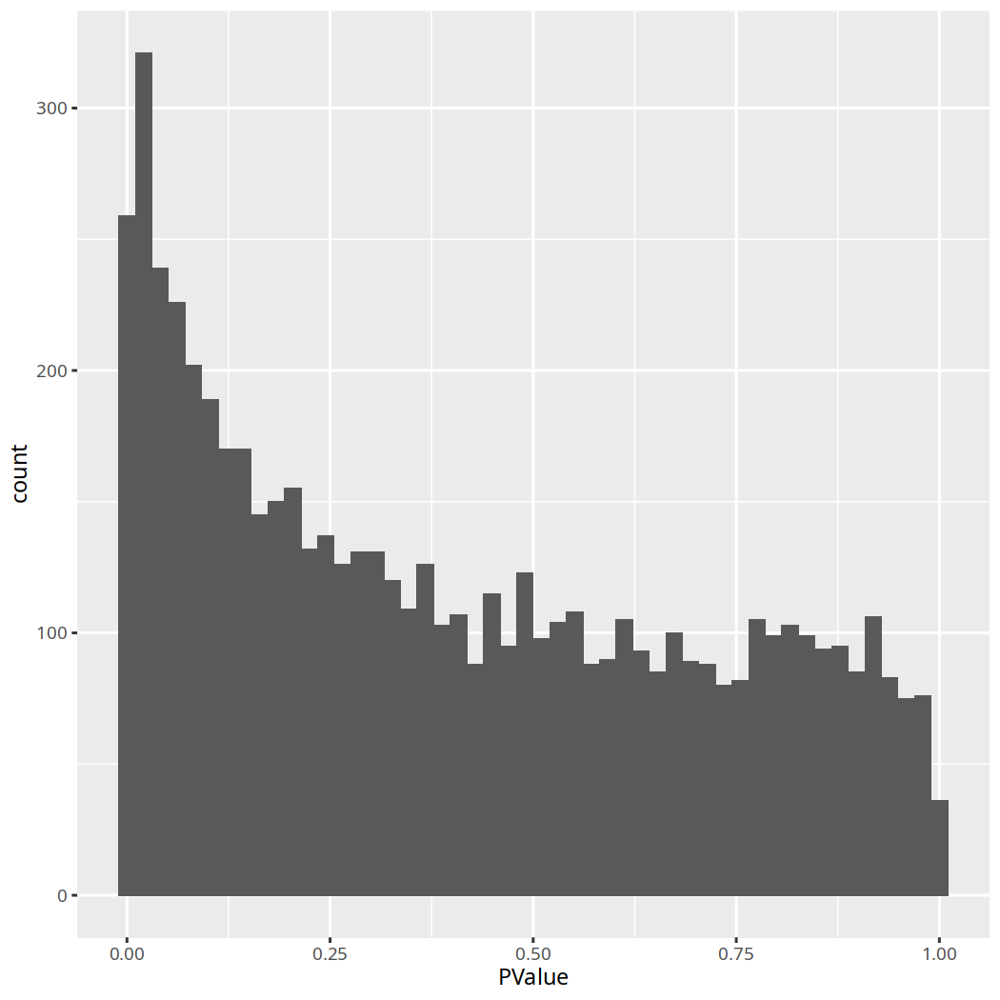

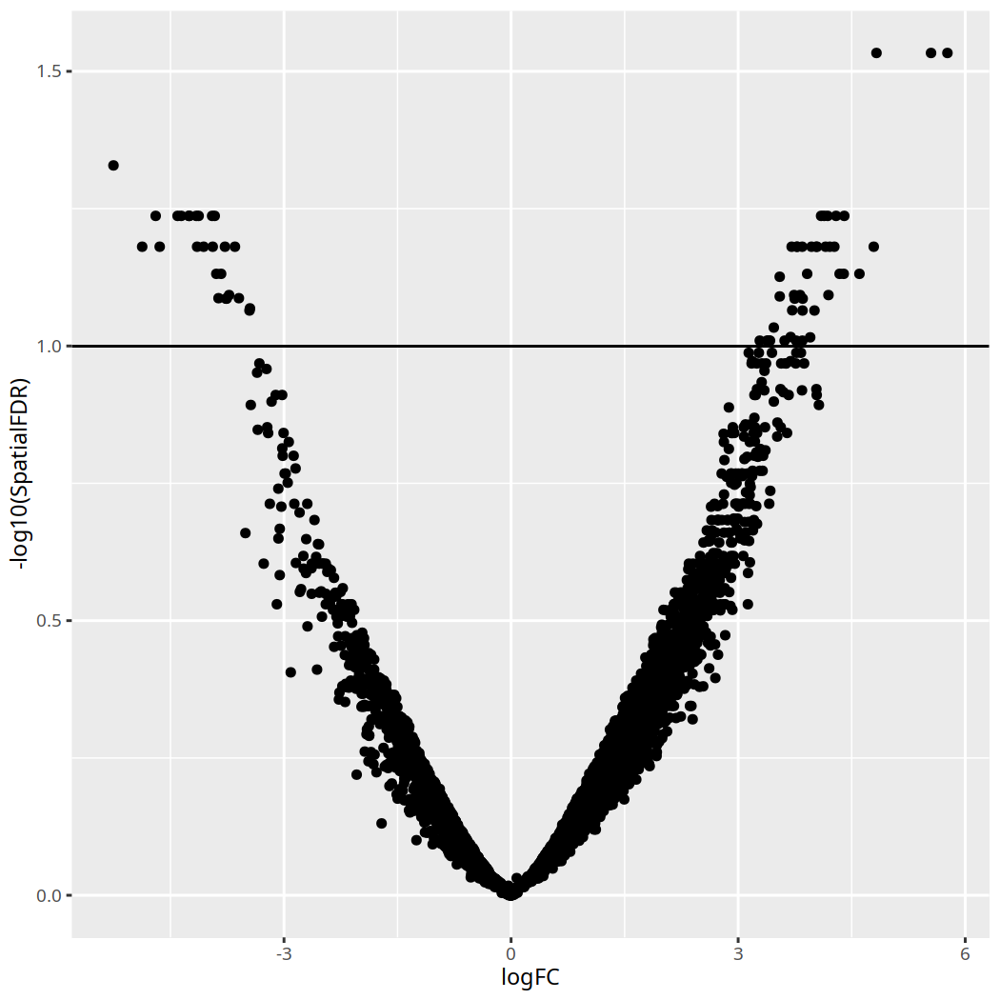

In [13]:
ggplot(da_results, aes(PValue)) + geom_histogram(bins=50)
ggplot(da_results, aes(logFC, -log10(SpatialFDR))) + 
  geom_point() +
  geom_hline(yintercept = 1) 

milo_obj = buildNhoodGraph(milo_obj)

umap_pl <- plotReducedDim(milo_obj, dimred = "UMAP", colour_by="Age_group", 
                          text_by = "annotation_level0", text_size = 3, point_size=0.5) 
+guides(fill="none")

umap_pl2 <- plotReducedDim(milo_obj, dimred = "UMAP", colour_by="annotation_level0", 
                           text_by = "annotation_level0",text_size = 3, point_size=0.5) +
  guides(fill="none")

umap_pl3 <- plotReducedDim(milo_obj, dimred = "UMAP", colour_by="DonorID", 
                           text_by = "DonorID",text_size = 3, point_size=0.5) +
  guides(fill="none")

str(milo_obj)

nh_graph_pl <- plotNhoodGraphDA(milo_obj, da_results, layout="UMAP",alpha=0.1) + 
scale_fill_gradient2(name = "logFC", low = muted("blue"), high = muted("red")) 

nh_plt_comb = umap_pl + nh_graph_pl +
  plot_layout(guides="collect")
ggsave(filename = "~/muscle_ageing/results/Figures/v2_3_rm_343B_ICM_SKM_nbh_plot_myonuclei.png", plot = nh_plt_comb, width = 7.5, height = 6)

In [14]:
da_results <- annotateNhoods(milo_obj, da_results, coldata_col = "annotation_level1")
head(da_results)

Converting annotation_level1 to factor...



,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR,annotation_level1,annotation_level1_fraction
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
1,0.1707835,8.114037,0.03439667,0.85286601,0.9482300,1,0.9476597,I-FAM,0.7594937
2,0.8352336,8.352529,0.50898391,0.47558086,0.7815935,2,0.7794642,MF-I,0.7891156
3,-2.0378342,7.872755,4.56992333,0.03254065,0.3323047,3,0.3361927,MF-II,0.5857143
4,-0.6182868,8.301270,0.34302368,0.55809051,0.8222116,4,0.8204952,MF-I,0.9047619
5,1.8049138,8.117262,3.03534962,0.08147234,0.4316292,5,0.4315799,MF-I,0.8584906
6,0.4138873,8.304724,0.20204775,0.65307407,0.8717601,6,0.8700297,MF-II,0.9082569


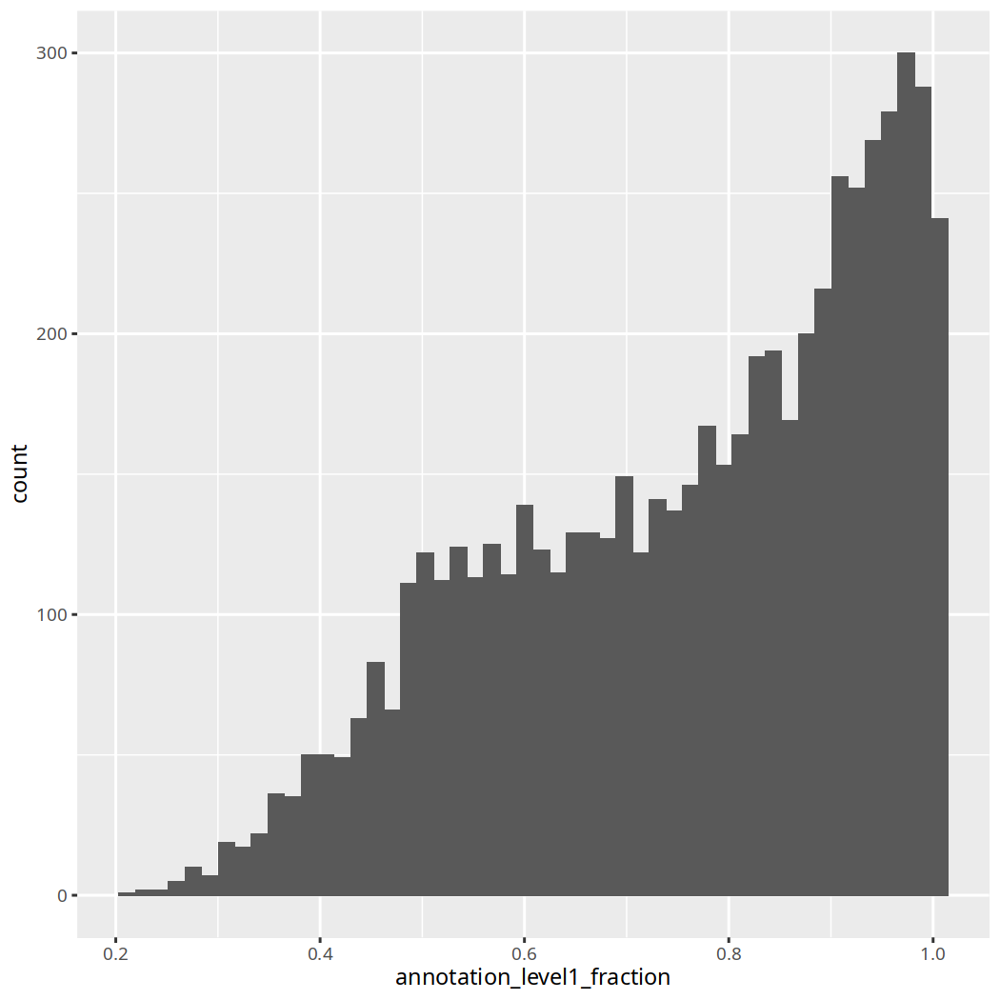

In [15]:
ggplot(da_results, aes(annotation_level1_fraction)) + geom_histogram(bins=50)
da_results$annotation_level1_clean_nhs <- ifelse(da_results$annotation_level1_fraction < 0.7, "Mixed", da_results$annotation_level1)

In [16]:
da_results$annotation_level1_fraction_clean_nhs <- ifelse(da_results$annotation_level1_fraction < 0.7, "Mixed", da_results$annotation_level1)

In [17]:
ctype_order_lev1 = c("MF-I" , "MF-II", "MF-Isn(fg)", "MF-IIsn(fg)", "I-FAM", "II-FAM", "I-OTU+TNF+", "II-OTU+TNF+", "MTJ", "NMJ", "NMJ accessory", "Mixed")

ctype_order_lev0 = c("MF_typeI","MF_typeII","MF_typeI(cytoplasmic)", "MF_typeII(cytoplasmic)","Specialised_MF_populations","Mixed")

In [18]:
da_results$annotation_level1_fraction_clean_nhs = factor(da_results$annotation_level1_fraction_clean_nhs, 
 levels = ctype_order_lev1)

In [19]:
library(ggbeeswarm)

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


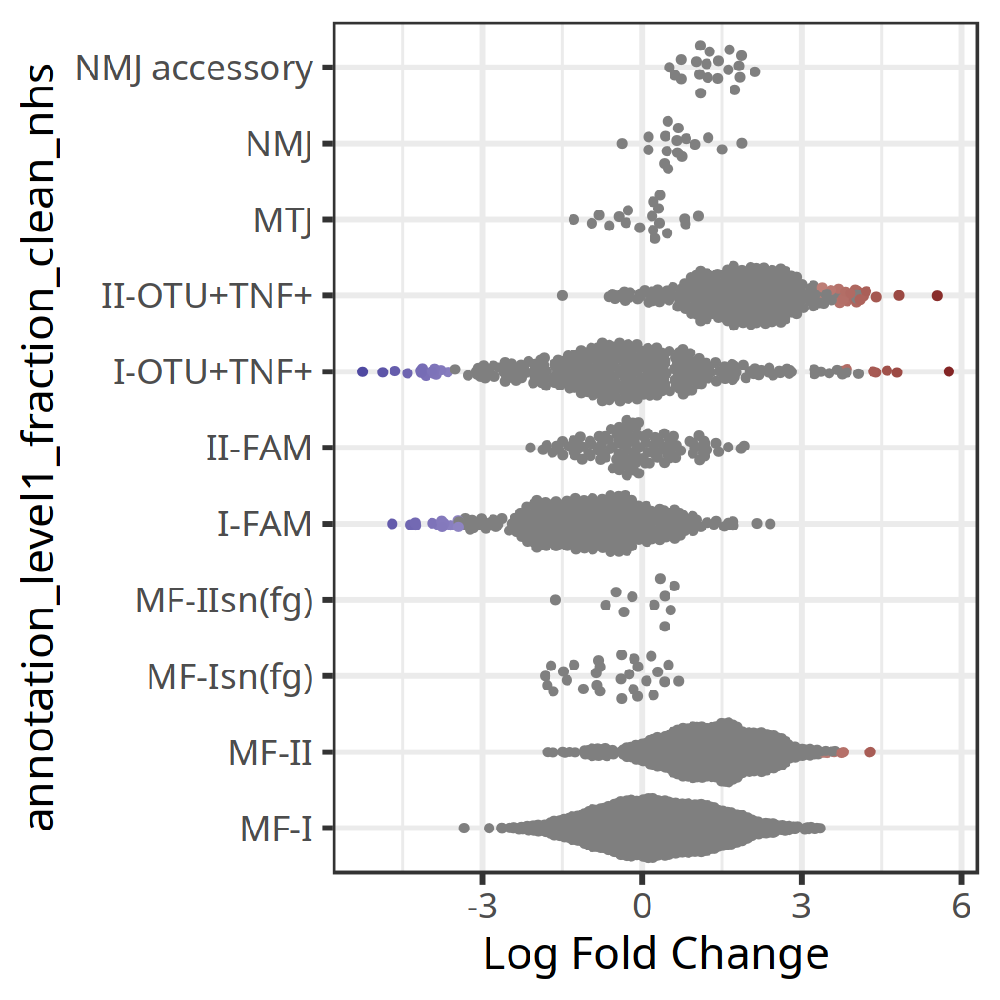

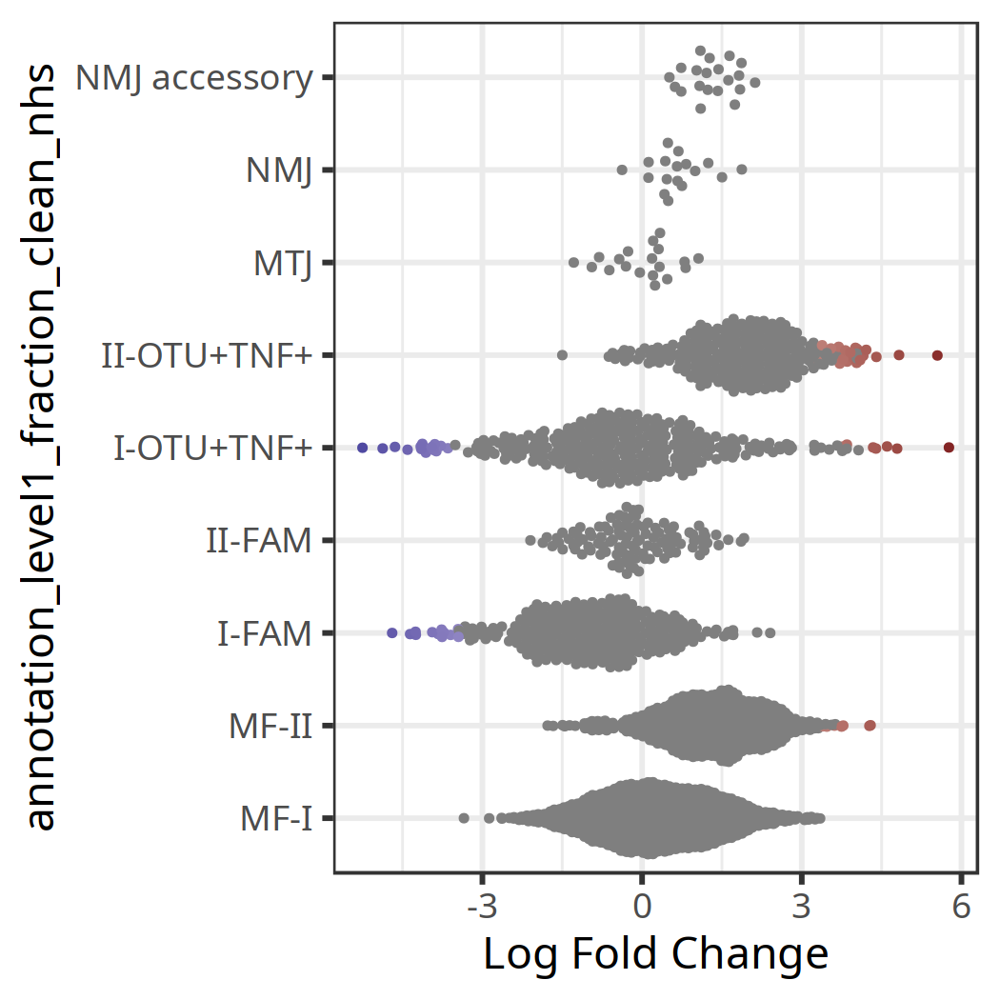

In [20]:
difab_plot = plotDAbeeswarm(da_results, subset.nhoods = da_results$annotation_level1_fraction_clean_nhs!='Mixed', group.by ="annotation_level1_fraction_clean_nhs") +scale_color_gradient2(low = muted("blue"), high = muted("red"))
difab_plot
difab_plot_rm = plotDAbeeswarm(da_results, subset.nhoods = !(da_results$annotation_level1_fraction_clean_nhs %in% c("MF-Isn(fg)", "MF-IIsn(fg)", 'Mixed')), group.by ="annotation_level1_fraction_clean_nhs") +scale_color_gradient2(low = muted("blue"), high = muted("red")) 
difab_plot_rm
#ggsave(filename = "~/muscle_ageing/results/Figures/v2_3_rm_343B_samples_atlas_Dif_abundance_myonuclei_filt.pdf", plot = difab_plot_rm, width = 6, height = 5)

### Code to remove Donor specific neighbourhoods 

In [21]:
da_results2 <- annotateNhoods(milo_obj, da_results, coldata_col = "DonorID")
head(da_results2)

Converting DonorID to factor...



,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR,annotation_level1,annotation_level1_fraction,annotation_level1_clean_nhs,annotation_level1_fraction_clean_nhs,DonorID,DonorID_fraction
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<fct>,<chr>,<dbl>
1,0.1707835,8.114037,0.03439667,0.85286601,0.9482300,1,0.9476597,I-FAM,0.7594937,I-FAM,I-FAM,583B,0.3544304
2,0.8352336,8.352529,0.50898391,0.47558086,0.7815935,2,0.7794642,MF-I,0.7891156,MF-I,MF-I,566B,0.3197279
3,-2.0378342,7.872755,4.56992333,0.03254065,0.3323047,3,0.3361927,MF-II,0.5857143,Mixed,Mixed,566B,0.3285714
4,-0.6182868,8.301270,0.34302368,0.55809051,0.8222116,4,0.8204952,MF-I,0.9047619,MF-I,MF-I,566B,0.5793651
5,1.8049138,8.117262,3.03534962,0.08147234,0.4316292,5,0.4315799,MF-I,0.8584906,MF-I,MF-I,367C,0.3018868
6,0.4138873,8.304724,0.20204775,0.65307407,0.8717601,6,0.8700297,MF-II,0.9082569,MF-II,MF-II,464C,0.3394495


### Plot distribution of max donor percentage across all neighbourhoods

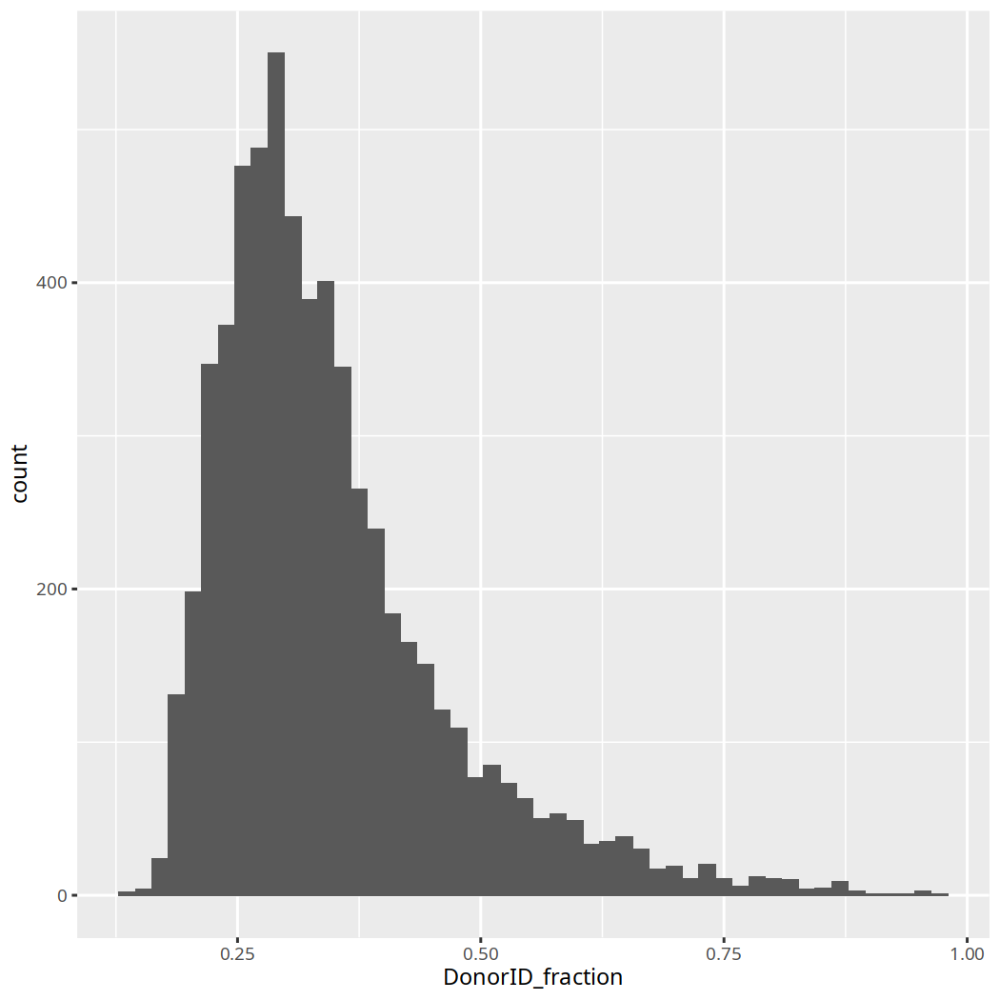

In [22]:
ggplot(da_results2, aes(DonorID_fraction)) + geom_histogram(bins=50) # plot distribution of max donor percentage across 

### Plot distribution of max donor percentage across significant neighbourhoods

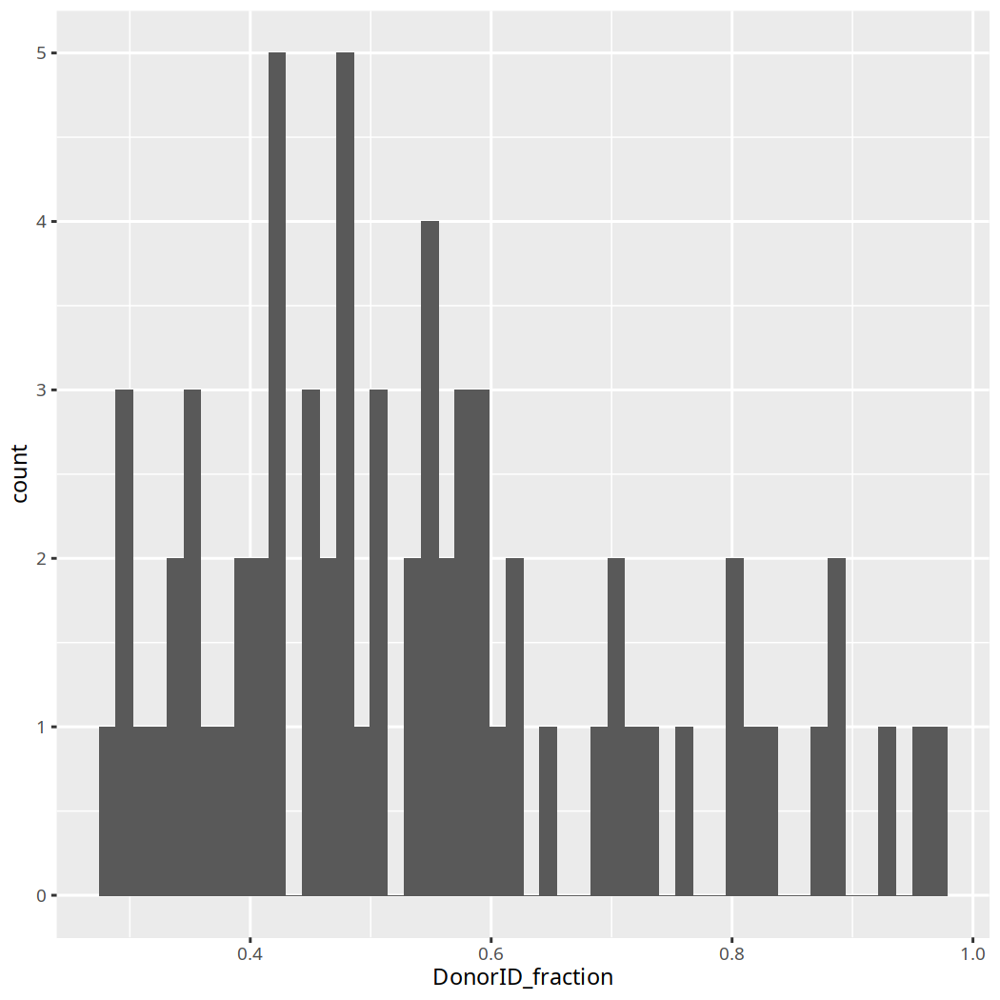

In [23]:
ggplot(da_results2[da_results2$SpatialFDR<0.1,], aes(DonorID_fraction)) + geom_histogram(bins=50)

### Do not display neighbourhoods that have contain more than 90 % cells from one donor on the milo beeswarm plot

In [24]:
da_results2$annotation_level1_clean2 <- ifelse(da_results2$DonorID_fraction > 0.9, "Donor-specific", da_results2$annotation_level1_clean)


In [25]:
sort(table(da_results2$annotation_level1_clean2))


Donor-specific    MF-IIsn(fg)            NMJ            MTJ  NMJ accessory 
             7             11             17             19             20 
    MF-Isn(fg)         II-FAM    II-OTU+TNF+          I-FAM     I-OTU+TNF+ 
            27            107            306            317            328 
         MF-II           MF-I          Mixed 
           931           1866           2179 

In [26]:
c(ctype_order_lev1, "Donor-specific")

[1] "MF-I"           "MF-II"          "MF-Isn(fg)"     "MF-IIsn(fg)"   
 [5] "I-FAM"          "II-FAM"         "I-OTU+TNF+"     "II-OTU+TNF+"   
 [9] "MTJ"            "NMJ"            "NMJ accessory"  "Mixed"         
[13] "Donor-specific"

In [27]:
da_results2$annotation_level1_clean2 = factor(da_results2$annotation_level1_clean2, levels = 
                                             c(ctype_order_lev1, "Donor-specific"))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


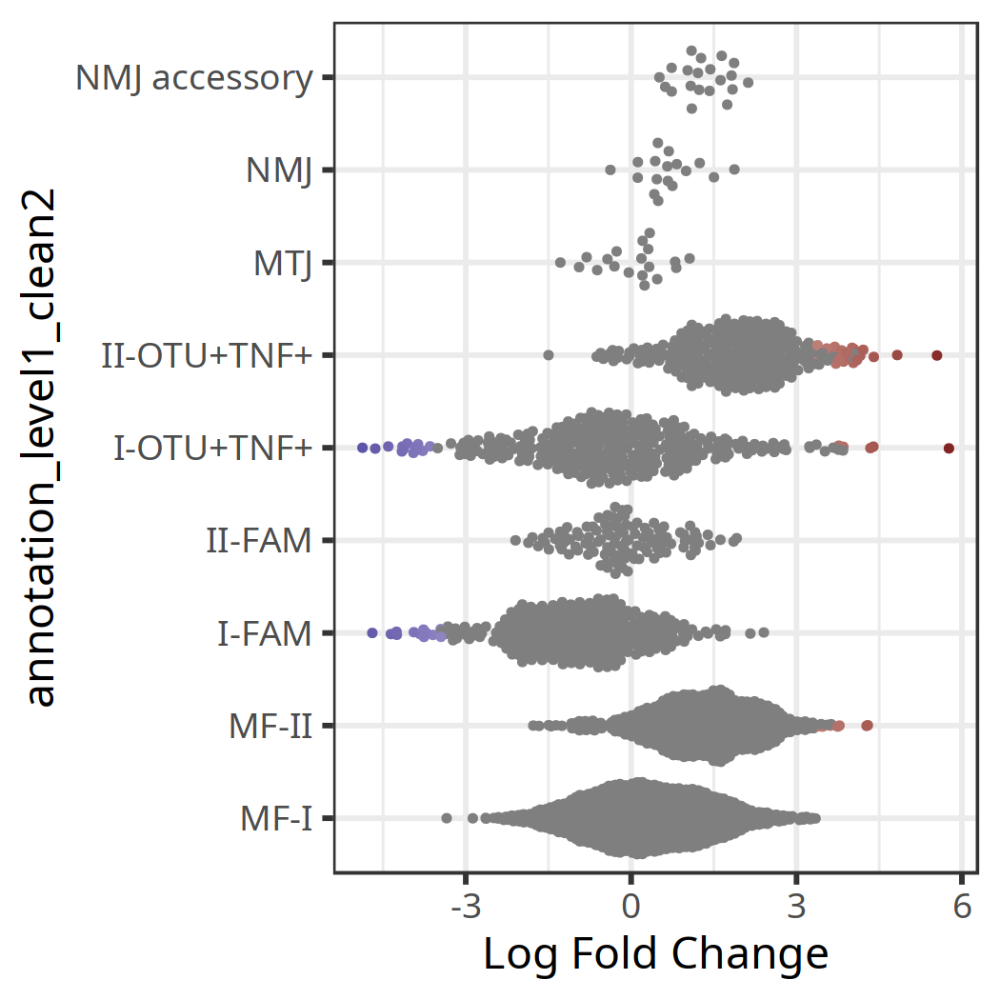

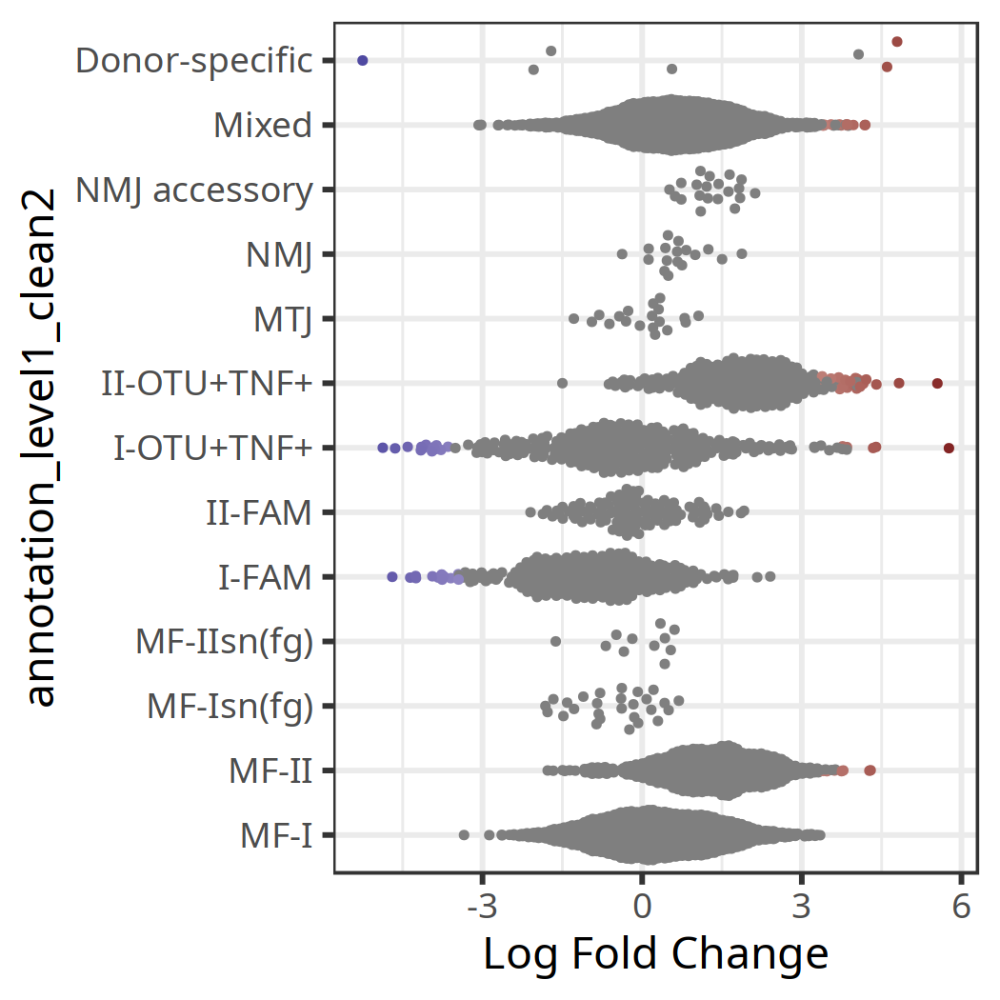

In [28]:
difab_plot_rm = plotDAbeeswarm(da_results2, subset.nhoods = !(da_results2$annotation_level1_clean2 %in% c('Mixed', 'Donor-specific', "MF-Isn(fg)", "MF-IIsn(fg)")), 
                            group.by ="annotation_level1_clean2") +scale_color_gradient2(low = muted("blue"), high = muted("red"))
difab_plot_rm
ggsave(filename = paste0(figures_path, "SKM_myonuclei_343Brm_da_nhds_Donorfilt2.pdf"), plot = difab_plot_rm, width = 6, height = 5)

difab_plot_all = plotDAbeeswarm(da_results2, group.by ="annotation_level1_clean2") +scale_color_gradient2(low = muted("blue"), high = muted("red")) 
difab_plot_all
ggsave(filename = paste0(figures_path, "SKM_myonuclei_da_343Brm_nhds_Donorfilt_all2.pdf"), plot = difab_plot_all, width = 6, height = 5)


### Change LogFC to 0 for Donor-specific and Mixed neighbourhoods  (won't be displayed on umap)

In [29]:
da_results2$logFC2 = ifelse(da_results2$annotation_level1_clean2 %in% c('Mixed', 'Donor-specific'), 0, da_results2$logFC)

In [30]:
milo_obj = buildNhoodGraph(milo_obj)

Warning message:
“ggrepel: 1 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


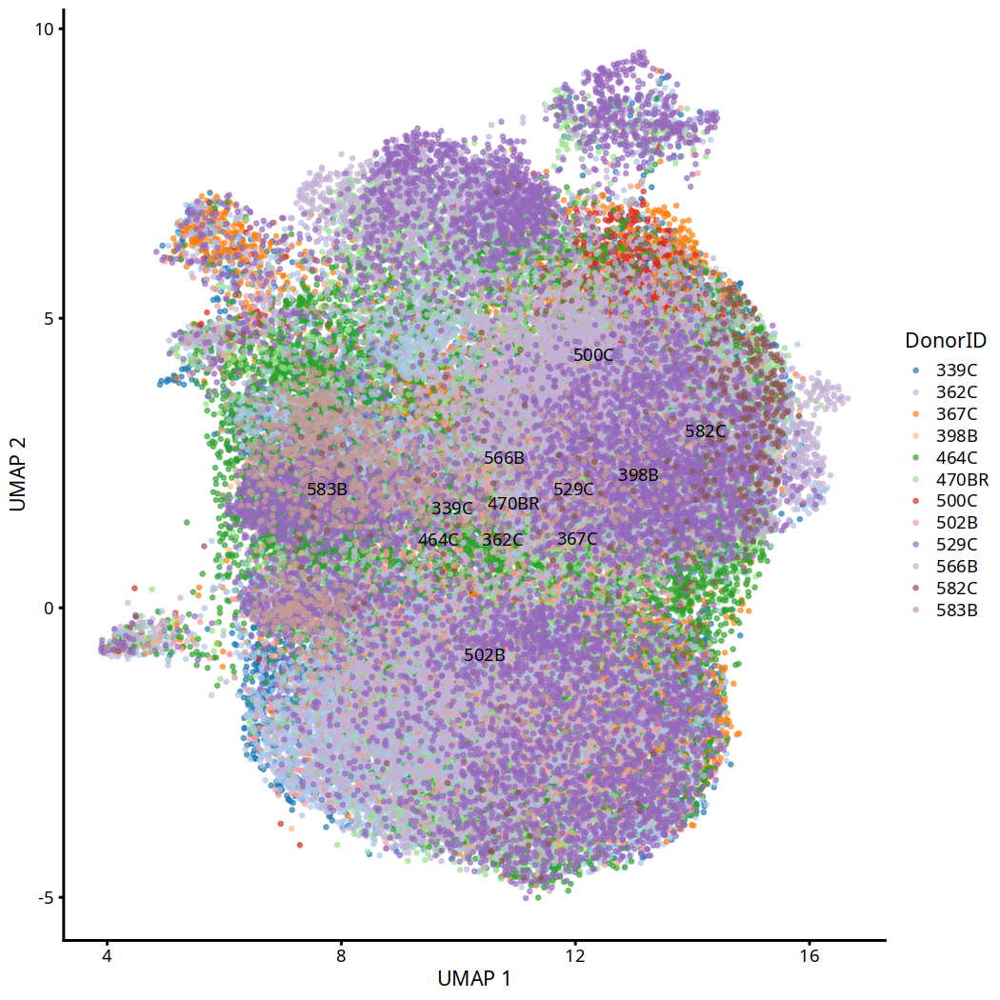

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


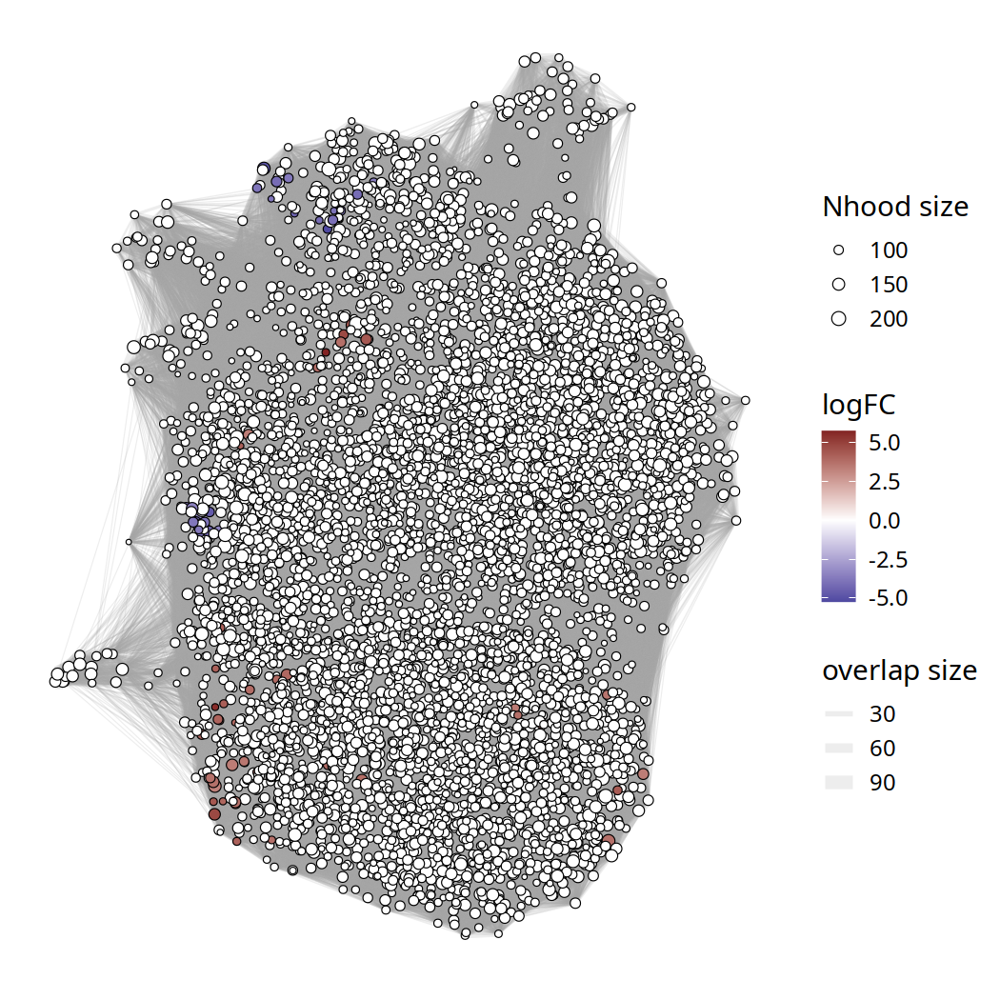

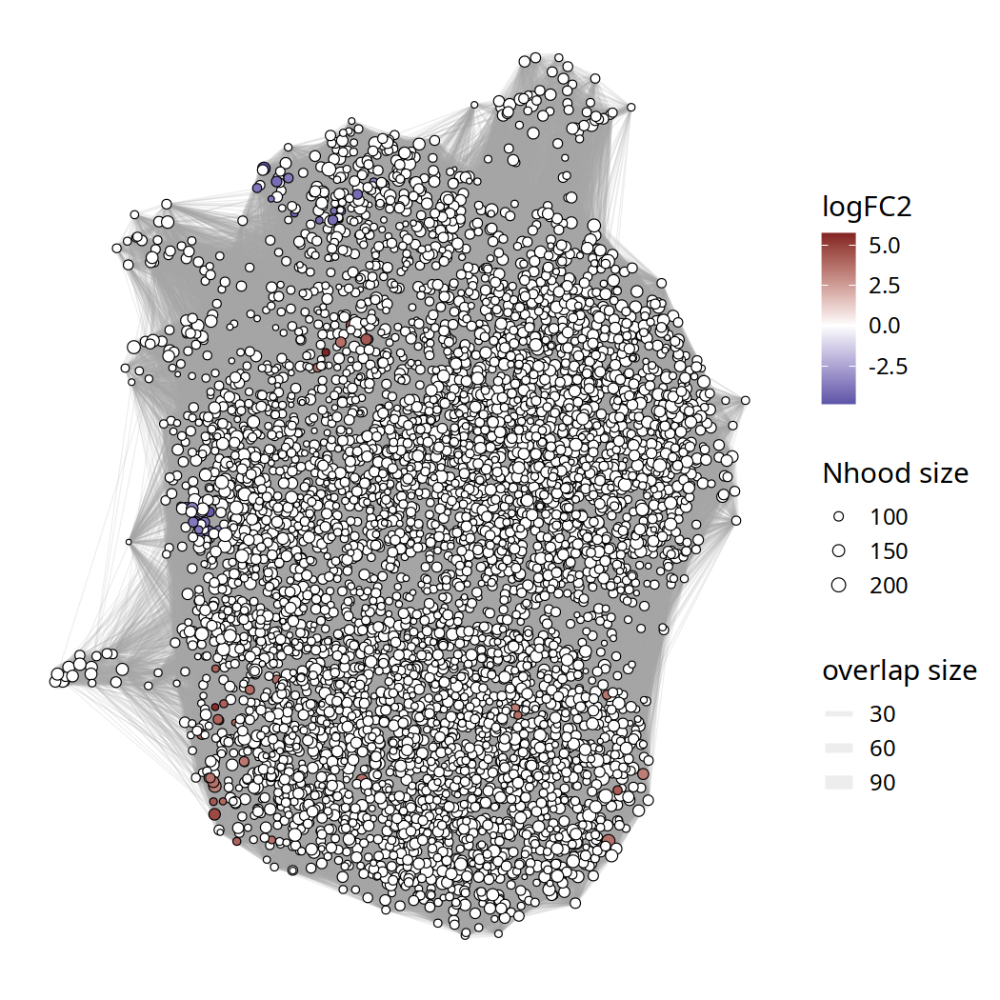

In [32]:
umap_pl <- plotReducedDim(milo_obj, dimred = "UMAP", colour_by="DonorID", 
                           text_by = "DonorID",text_size = 3, point_size=0.5) +
  guides(fill="none")
umap_pl

ggsave(paste0(figures_path, "SKM_myonuclei343BrmUMAP2donor2.pdf"), umap_pl, width = 4.5, height = 4.5)
## plot neighbourhood graph highlighting nhds with significant chnages 
## (Donor-specific and mixed populations are kept in)
nh_graph_pl1 <- plotNhoodGraphDA(milo_obj, da_results2, layout="UMAP",alpha=0.1) + 
scale_fill_gradient2(name = "logFC", low = muted("blue"), high = muted("red")) 
nh_graph_pl1
ggsave(paste0(figures_path, "SKM_myonuclei343Brm_nhds2.pdf"), nh_graph_pl1, width = 4.5, height = 4.5)
ggsave(paste0(figures_path, "SKM_myonuclei343Brm_nhds2.png"), nh_graph_pl1, width = 4.5, height = 4.5)
## plot neighbourhood graph highlighting nhds with significant chnages 
## (Donor-specific and mixed populations are removed)
nh_graph_pl2 <- plotNhoodGraphDA(milo_obj, da_results2, layout="UMAP",alpha=0.1, res_column = "logFC2") + 
scale_fill_gradient2(name = "logFC2", low = muted("blue"), high = muted("red"))

nh_graph_pl2
ggsave(paste0(figures_path, "SKM_myonuclei343Brm_nhds_filt2.pdf"), nh_graph_pl2, width = 4.5, height = 4.5)
ggsave(paste0(figures_path, "SKM_myonuclei343Brm_nhds_filt2.png"), nh_graph_pl2, width = 4.5, height = 4.5)
#nh_plt_comb = umap_pl + nh_graph_pl1 +nh_graph_pl2
#  plot_layout(guides="collect")

### Save table with neighbourhoods information

In [33]:
fwrite(da_results2, file = paste0(tables_path,"SKM_myonuclei343Brm_nhds_all.csv"))

### Test ventilation effect

In [49]:
exp_design$Ventilation_cat

[1] "short" "short" "short" "long"  "short" "short" "short" "short" "short"
[10] "long"  "long"  "short" "short" "short" "short" "short" "short" "short"
[19] "long"  "long"

In [34]:
da_results_vent = testNhoods(milo_obj, design = ~ Ventilation_cat, design.df = exp_design, 
                        reduced.dim = "X_scVI")
head(da_results_vent)

da_results_vent %>%
  arrange(SpatialFDR) %>%
  head() 

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,-0.7589156,8.754207,0.5978035,0.439418977,0.7717261,1,0.7771601
2,-1.6500460,8.558646,3.3279044,0.068116316,0.3925060,2,0.4080646
3,1.1470945,7.957793,1.2333302,0.266762803,0.6437651,3,0.6524027
4,-0.2456313,8.471879,0.0682614,0.793885696,0.9387917,4,0.9407238
5,-0.6323683,7.693451,0.4474186,0.503564778,0.8112178,5,0.8163350
6,3.5808997,7.756174,7.1646141,0.007436669,0.1486397,6,0.1632161


,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
5273,-4.846226,7.986891,26.66160,2.428117e-07,0.001486008,5273,0.002104110
514,-4.425910,8.450446,23.73424,1.107506e-06,0.002128630,514,0.002600764
854,-4.488152,8.084109,24.56395,7.199039e-07,0.002128630,854,0.002600764
968,-4.299056,8.267041,23.29528,1.391261e-06,0.002128630,968,0.002600764
5446,-4.131776,8.400177,21.42870,3.676517e-06,0.004500057,5446,0.005419171
1664,-4.011233,8.257622,20.91368,4.809720e-06,0.004905914,1664,0.005890870


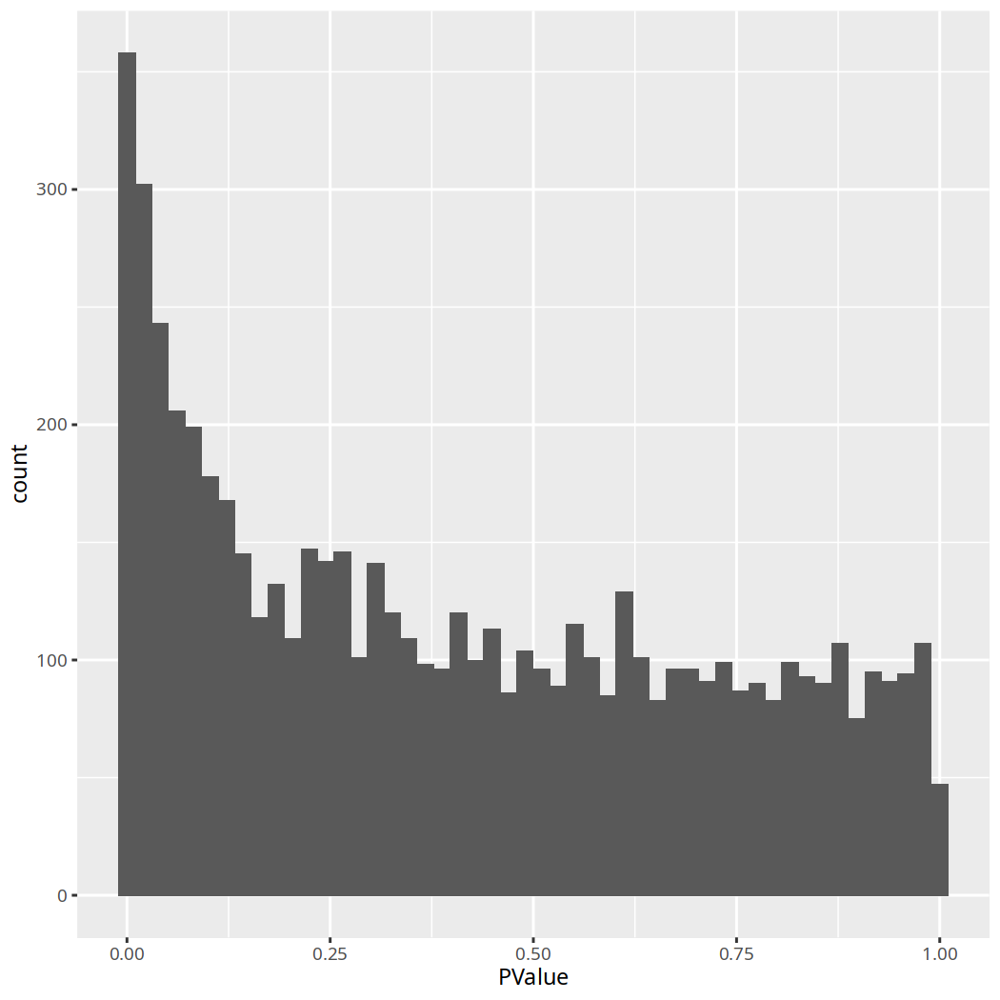

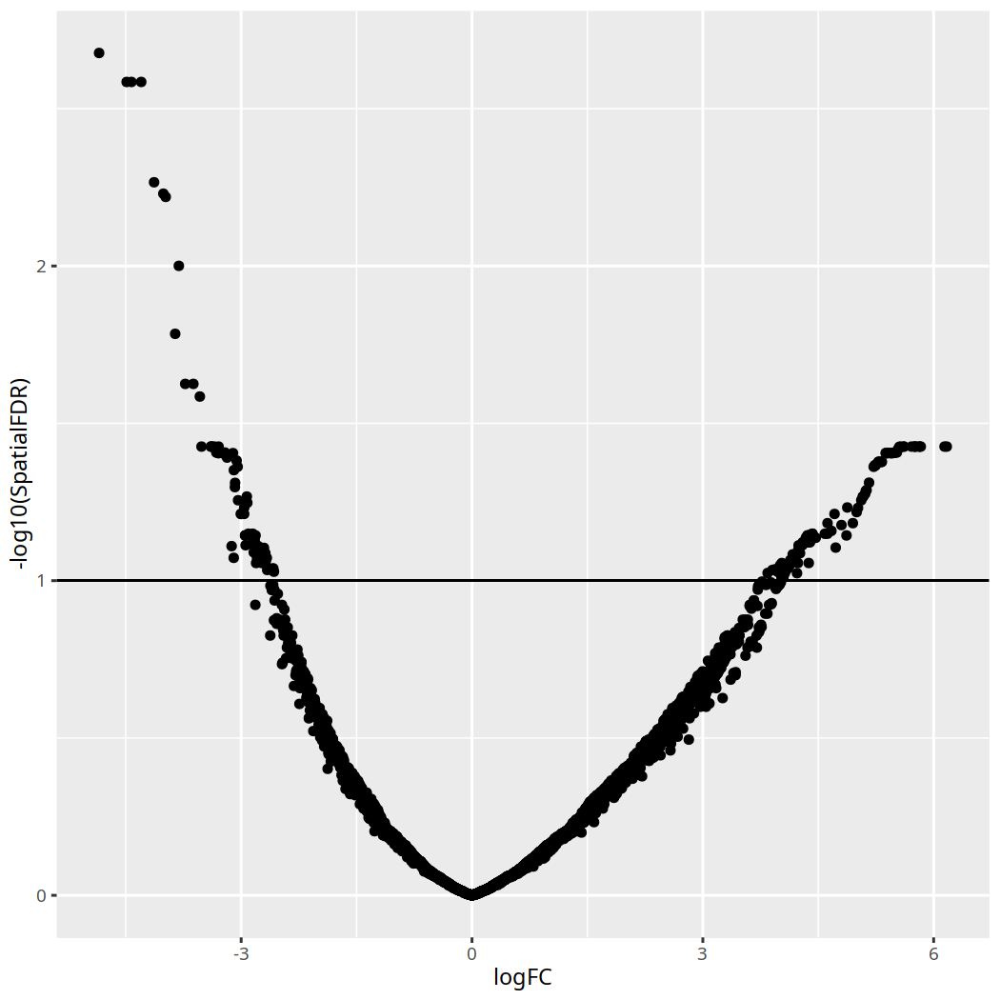

In [35]:
ggplot(da_results_vent, aes(PValue)) + geom_histogram(bins=50)
ggplot(da_results_vent, aes(logFC, -log10(SpatialFDR))) + 
  geom_point() +
  geom_hline(yintercept = 1) 

milo_obj = buildNhoodGraph(milo_obj)

umap_pl <- plotReducedDim(milo_obj, dimred = "UMAP", colour_by="Age_group", 
                          text_by = "annotation_level0", text_size = 3, point_size=0.5) 
+guides(fill="none")

umap_pl2 <- plotReducedDim(milo_obj, dimred = "UMAP", colour_by="annotation_level0", 
                           text_by = "annotation_level0",text_size = 3, point_size=0.5) +
  guides(fill="none")

umap_pl3 <- plotReducedDim(milo_obj, dimred = "UMAP", colour_by="DonorID", 
                           text_by = "DonorID",text_size = 3, point_size=0.5) +
  guides(fill="none")

str(milo_obj)

nh_graph_pl <- plotNhoodGraphDA(milo_obj, da_results, layout="UMAP",alpha=0.1) + 
scale_fill_gradient2(name = "logFC", low = muted("blue"), high = muted("red")) 

nh_plt_comb = umap_pl + nh_graph_pl +
  plot_layout(guides="collect")
ggsave(filename = "~/muscle_ageing/results/Figures/v2_3_rm_343B_ICM_SKM_nbh_plot_myonuclei.png", plot = nh_plt_comb, width = 7.5, height = 6)

In [37]:
da_results_vent <- annotateNhoods(milo_obj, da_results_vent, coldata_col = "annotation_level1")
head(da_results_vent)

Converting annotation_level1 to factor...



,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR,annotation_level1,annotation_level1_fraction
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
1,-0.7589156,8.754207,0.5978035,0.439418977,0.7717261,1,0.7771601,MF-I,0.8636364
2,-1.6500460,8.558646,3.3279044,0.068116316,0.3925060,2,0.4080646,MF-I,0.7089552
3,1.1470945,7.957793,1.2333302,0.266762803,0.6437651,3,0.6524027,MF-I,0.9651163
4,-0.2456313,8.471879,0.0682614,0.793885696,0.9387917,4,0.9407238,MF-I,0.9847328
5,-0.6323683,7.693451,0.4474186,0.503564778,0.8112178,5,0.8163350,MF-I,0.7857143
6,3.5808997,7.756174,7.1646141,0.007436669,0.1486397,6,0.1632161,MF-II,0.5466667


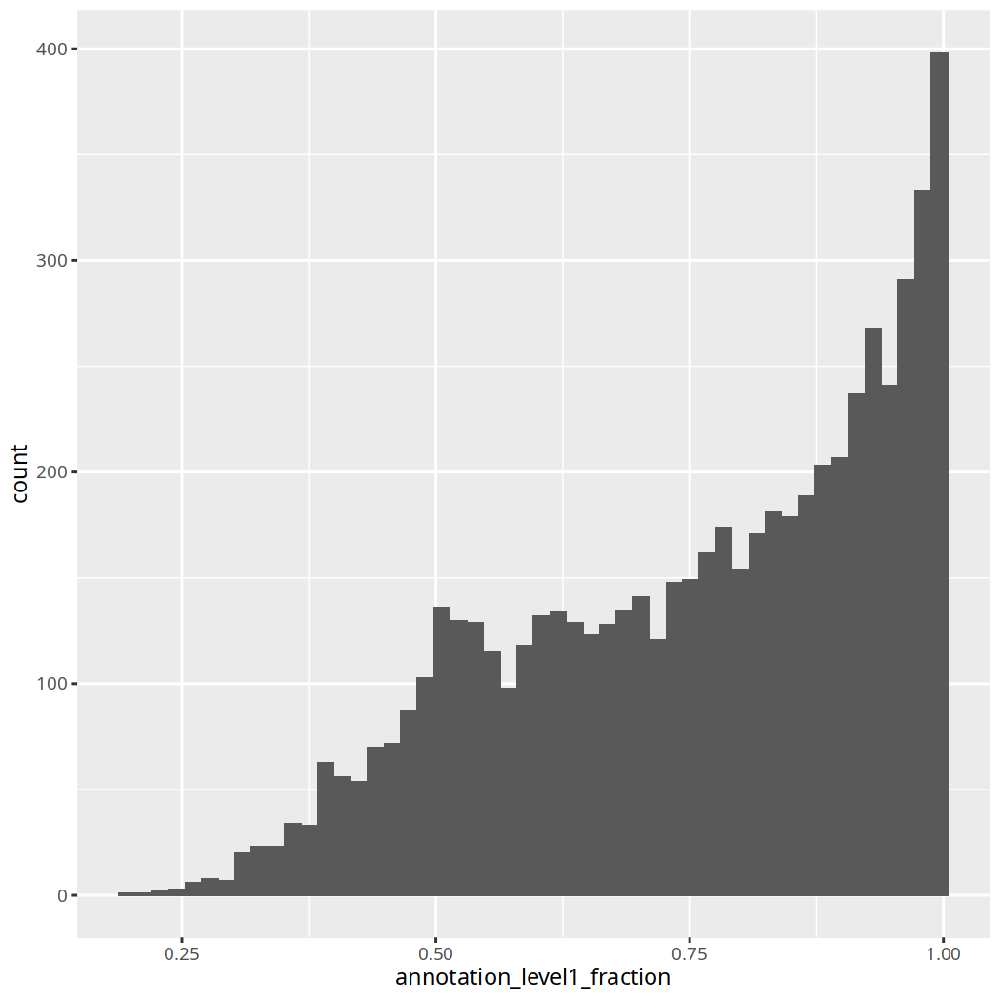

In [39]:
ggplot(da_results_vent, aes(annotation_level1_fraction)) + geom_histogram(bins=50)
da_results_vent$annotation_level1_clean_nhs <- ifelse(da_results_vent$annotation_level1_fraction < 0.7, "Mixed", da_results_vent$annotation_level1)

In [40]:
ctype_order_lev1 = c("MF-I" , "MF-II", "MF-Isn(fg)", "MF-IIsn(fg)", "I-FAM", "II-FAM", "I-OTU+TNF+", "II-OTU+TNF+", "MTJ", "NMJ", "NMJ accessory", "Mixed")

ctype_order_lev0 = c("MF_typeI","MF_typeII","MF_typeI(cytoplasmic)", "MF_typeII(cytoplasmic)","Specialised_MF_populations","Mixed")

In [42]:
da_results_vent$annotation_level1_clean_nhs = factor(da_results_vent$annotation_level1_clean_nhs, 
 levels = ctype_order_lev1)

In [43]:
library(ggbeeswarm)

In [46]:
sort(da_results_vent

,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR,annotation_level1,annotation_level1_fraction,annotation_level1_clean_nhs
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<fct>
1,-0.75891555,8.754207,0.597803504,0.4394189770,0.77172610,1,0.77716014,MF-I,0.8636364,MF-I
2,-1.65004601,8.558646,3.327904424,0.0681163156,0.39250601,2,0.40806463,MF-I,0.7089552,MF-I
3,1.14709447,7.957793,1.233330150,0.2667628034,0.64376512,3,0.65240269,MF-I,0.9651163,MF-I
4,-0.24563130,8.471879,0.068261398,0.7938856957,0.93879167,4,0.94072383,MF-I,0.9847328,MF-I
5,-0.63236834,7.693451,0.447418598,0.5035647785,0.81121781,5,0.81633499,MF-I,0.7857143,MF-I
6,3.58089973,7.756174,7.164614064,0.0074366692,0.14863971,6,0.16321614,MF-II,0.5466667,Mixed
7,-0.52857802,8.066308,0.330298745,0.5654844027,0.84470699,7,0.84916387,I-FAM,0.5301205,Mixed
8,-0.08040076,8.591755,0.006861101,0.9339854611,0.98402465,8,0.98459899,MF-II,0.9716312,MF-II
9,2.73134971,7.896013,5.190212583,0.0227163436,0.24606022,9,0.26255830,MF-I,0.9571429,MF-I


In [47]:
da_results_vent %>%
  arrange(SpatialFDR) %>%
  head() 

,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR,annotation_level1,annotation_level1_fraction,annotation_level1_clean_nhs
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<fct>
5273,-4.846226,7.986891,26.66160,2.428117e-07,0.001486008,5273,0.002104110,I-OTU+TNF+,0.8961039,I-OTU+TNF+
514,-4.425910,8.450446,23.73424,1.107506e-06,0.002128630,514,0.002600764,I-FAM,0.9274194,I-FAM
854,-4.488152,8.084109,24.56395,7.199039e-07,0.002128630,854,0.002600764,I-FAM,0.8720930,I-FAM
968,-4.299056,8.267041,23.29528,1.391261e-06,0.002128630,968,0.002600764,I-FAM,0.7623762,I-FAM
5446,-4.131776,8.400177,21.42870,3.676517e-06,0.004500057,5446,0.005419171,I-FAM,0.8898305,I-FAM
1664,-4.011233,8.257622,20.91368,4.809720e-06,0.004905914,1664,0.005890870,I-FAM,0.6930693,Mixed


Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


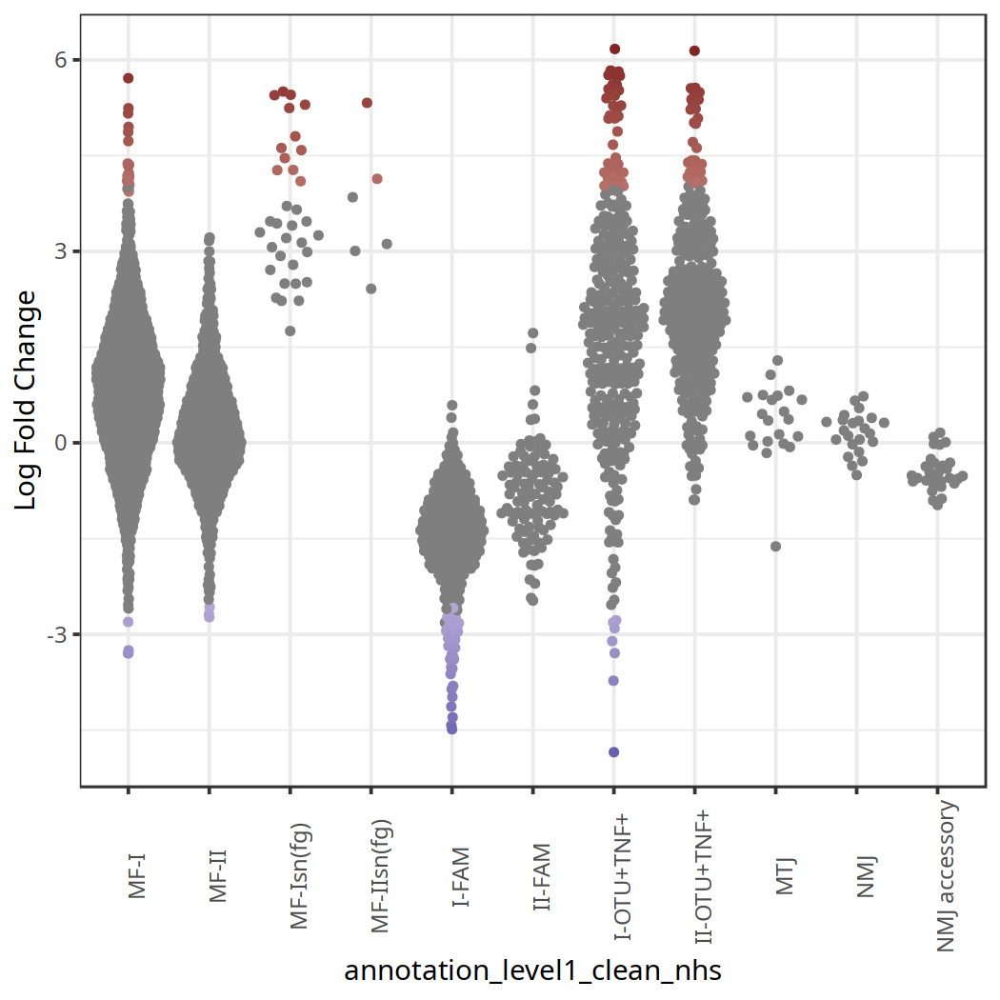

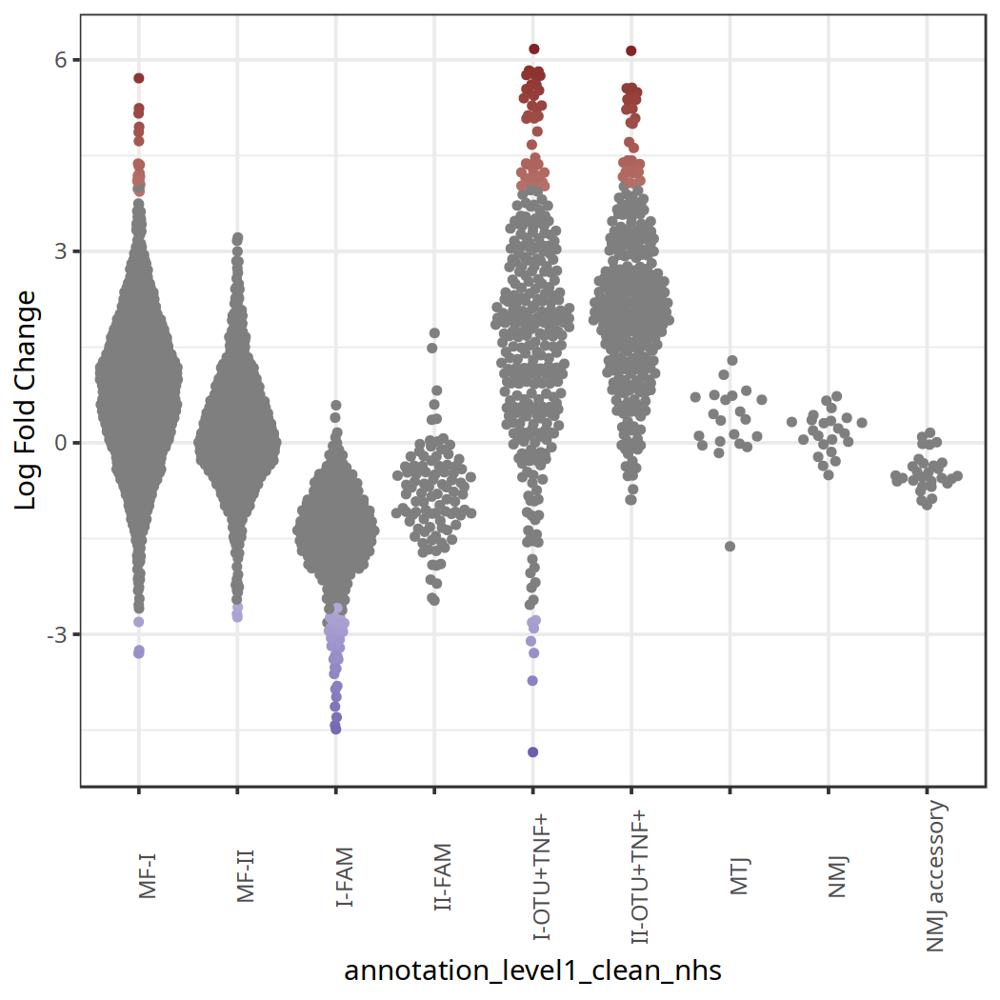

In [48]:
difab_plot = plotDAbeeswarm(da_results_vent, subset.nhoods = da_results_vent$annotation_level1_clean_nhs!='Mixed', group.by ="annotation_level1_clean_nhs") +scale_color_gradient2(low = muted("blue"), high = muted("red"))
difab_plot
difab_plot_rm = plotDAbeeswarm(da_results_vent, subset.nhoods = !(da_results_vent$annotation_level1_clean_nhs %in% c("MF-Isn(fg)", "MF-IIsn(fg)", 'Mixed')), group.by ="annotation_level1_clean_nhs") +scale_color_gradient2(low = muted("blue"), high = muted("red")) 
difab_plot_rm
#ggsave(filename = "~/muscle_ageing/results/Figures/v2_3_rm_343B_samples_atlas_Dif_abundance_myonuclei_filt.pdf", plot = difab_plot_rm, width = 6, height = 5)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


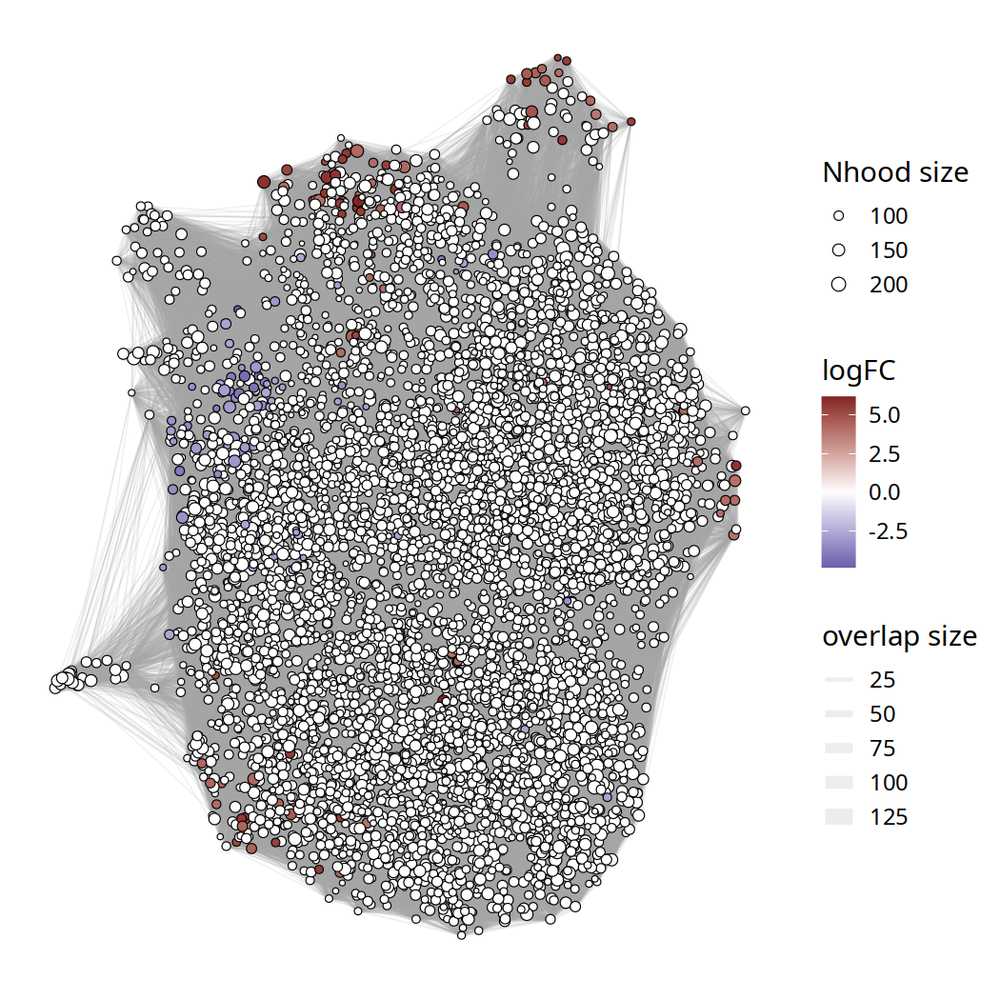

In [50]:
## plot neighbourhood graph highlighting nhds with significant chnages 
## (Donor-specific and mixed populations are kept in)
nh_graph_pl1 <- plotNhoodGraphDA(milo_obj, da_results_vent, layout="UMAP",alpha=0.1) + 
scale_fill_gradient2(name = "logFC", low = muted("blue"), high = muted("red")) 
nh_graph_pl1
#ggsave(paste0(figures_path, "SKM_myonuclei343Brm_nhds.pdf"), nh_graph_pl1, width = 4, height = 3.5)
ggsave(paste0(figures_path, "SKM_myonuclei343Brm_nhds_vent.png"), nh_graph_pl1, width = 4, height = 3.5)

Warning message:
“ggrepel: 4 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


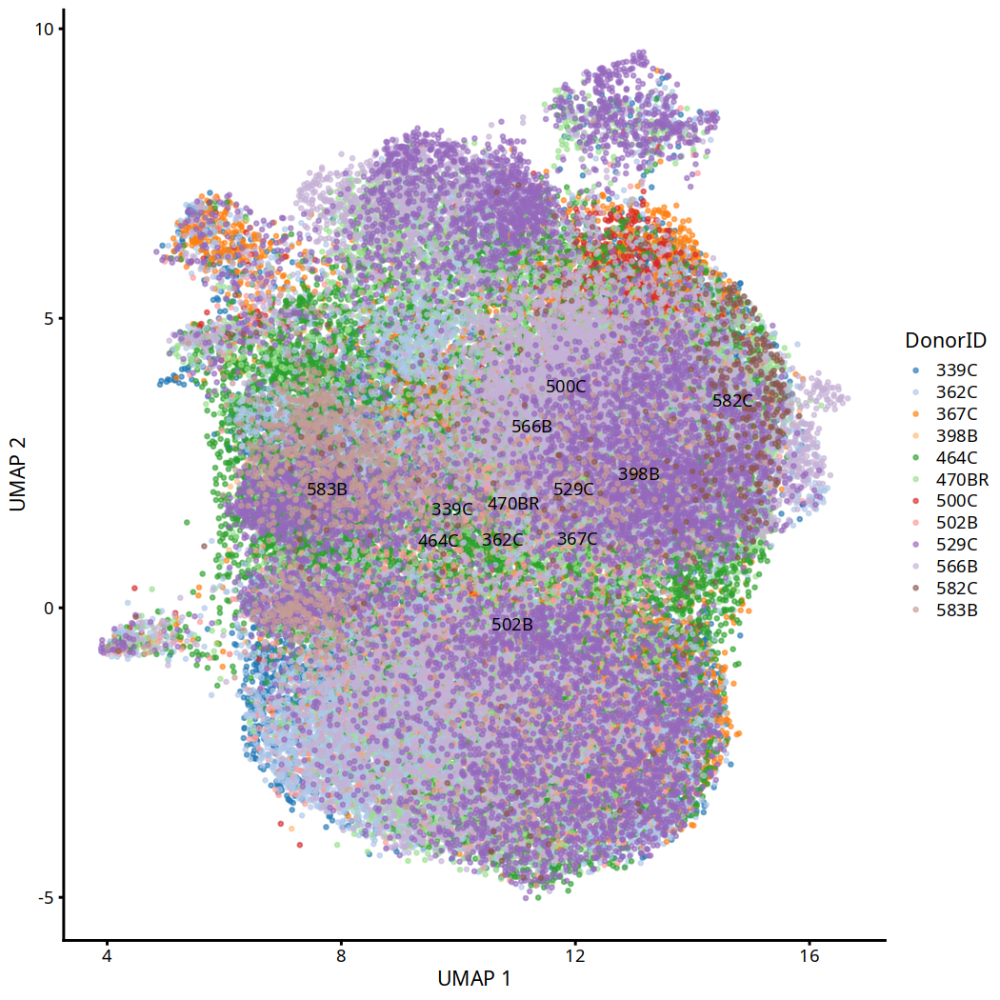

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


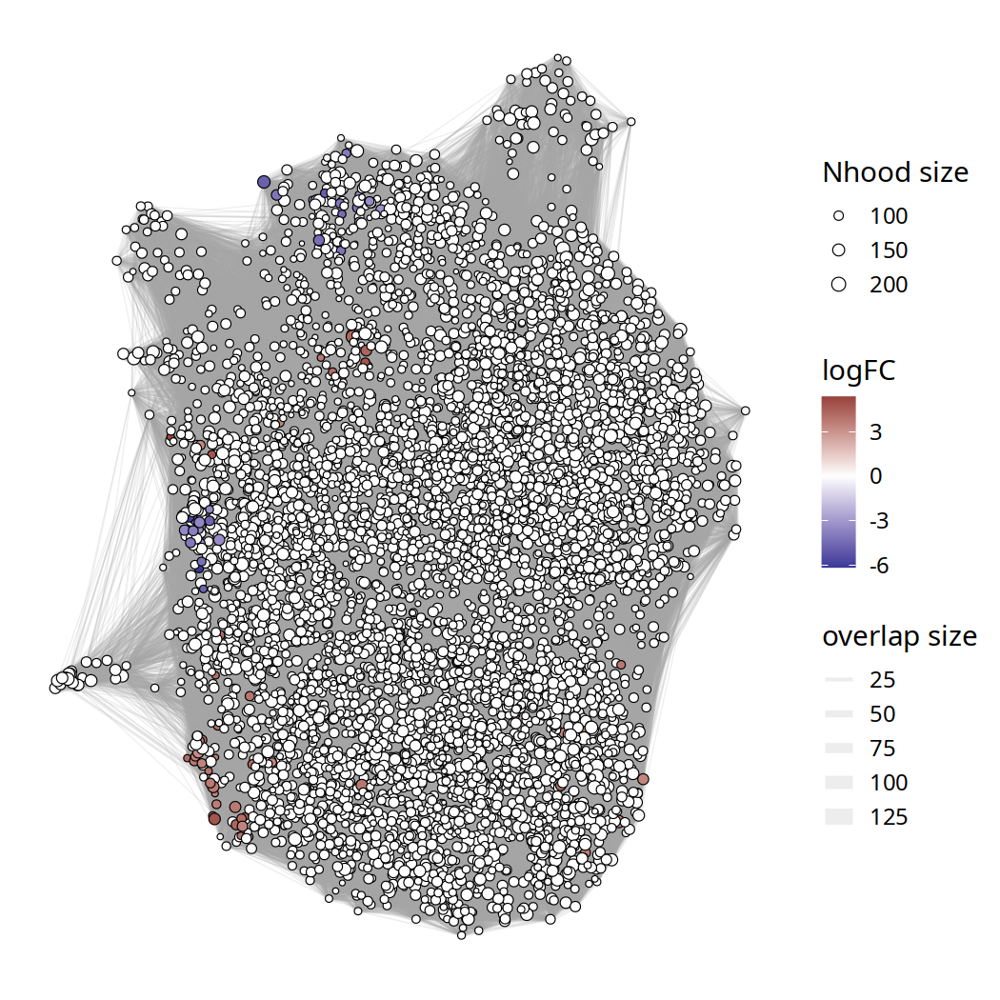

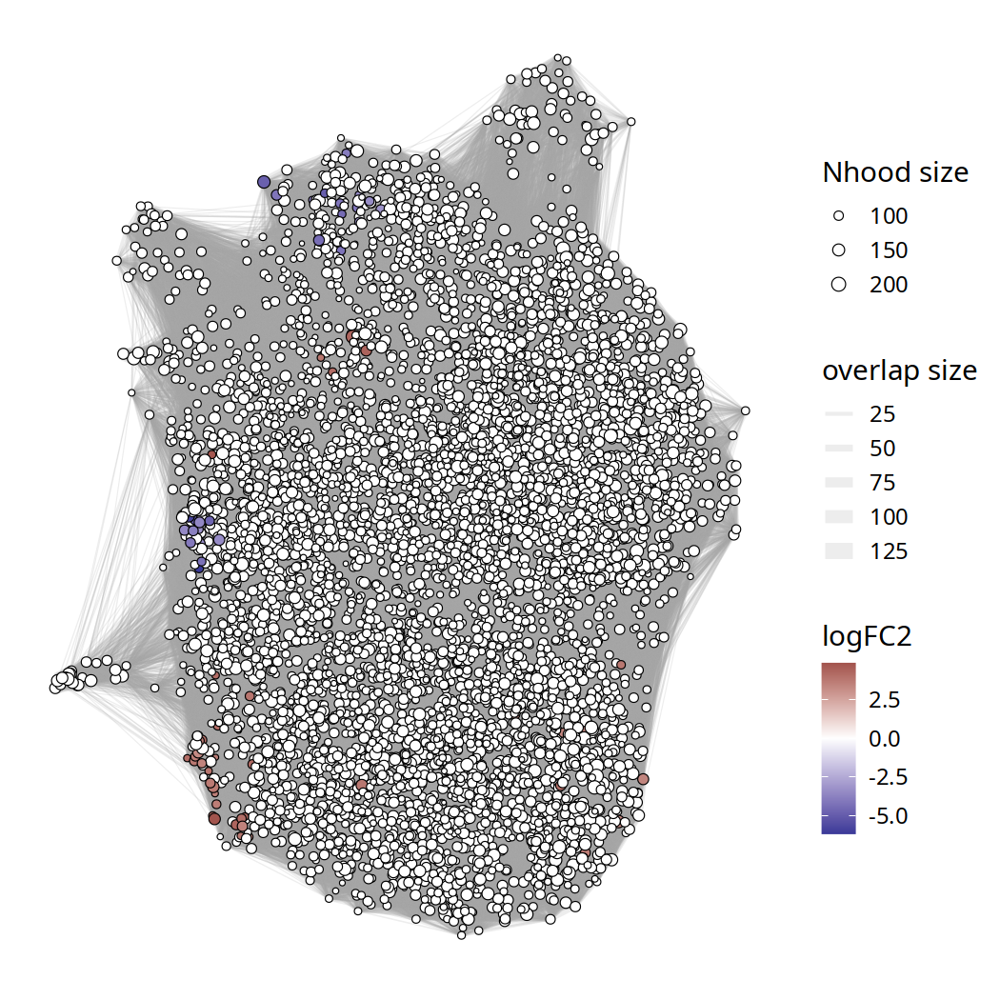

In [32]:
## plot neighbourhood graph highlighting nhds with significant chnages 
## (Donor-specific and mixed populations are removed)
nh_graph_pl2 <- plotNhoodGraphDA(milo_obj, da_results2, layout="UMAP",alpha=0.1, res_column = "logFC2") + 
scale_fill_gradient2(name = "logFC2", low = muted("blue"), high = muted("red"))

nh_graph_pl2
#ggsave(paste0(figures_path, "SKM_myonuclei343Brm_nhds_filt.pdf"), nh_graph_pl2, width = 4, height = 3.5)
ggsave(paste0(figures_path, "SKM_myonuclei343Brm_nhds_filt.png"), nh_graph_pl2, width = 4, height = 3.5)
#nh_plt_comb = umap_pl + nh_graph_pl1 +nh_graph_pl2
#  plot_layout(guides="collect")

In [56]:
library(ggplot2)

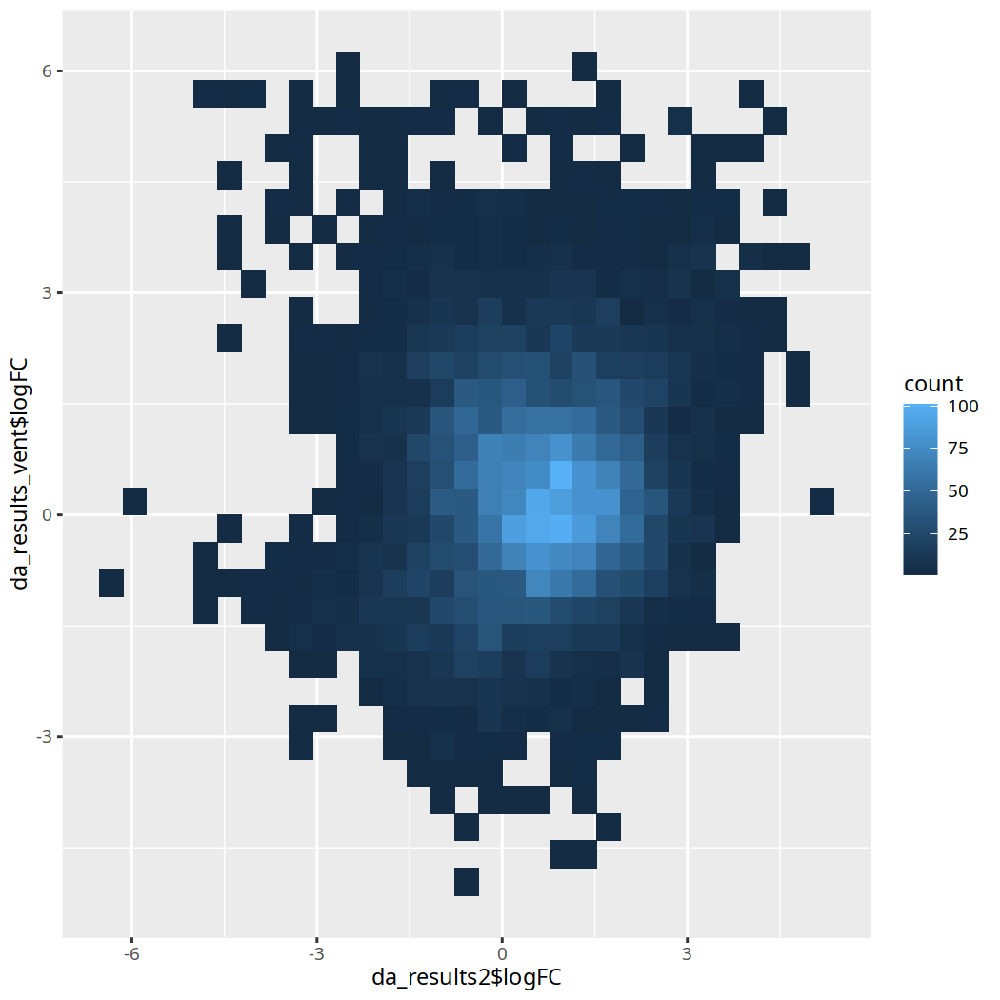

In [66]:
ggplot(data = da_results2, aes (x = da_results2$logFC,  y = da_results_vent$logFC)) + geom_bin2d()

In [51]:
da_results_vent

,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR,annotation_level1,annotation_level1_fraction,annotation_level1_clean_nhs
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<fct>
1,-0.75891555,8.754207,0.597803504,0.4394189770,0.77172610,1,0.77716014,MF-I,0.8636364,MF-I
2,-1.65004601,8.558646,3.327904424,0.0681163156,0.39250601,2,0.40806463,MF-I,0.7089552,MF-I
3,1.14709447,7.957793,1.233330150,0.2667628034,0.64376512,3,0.65240269,MF-I,0.9651163,MF-I
4,-0.24563130,8.471879,0.068261398,0.7938856957,0.93879167,4,0.94072383,MF-I,0.9847328,MF-I
5,-0.63236834,7.693451,0.447418598,0.5035647785,0.81121781,5,0.81633499,MF-I,0.7857143,MF-I
6,3.58089973,7.756174,7.164614064,0.0074366692,0.14863971,6,0.16321614,MF-II,0.5466667,Mixed
7,-0.52857802,8.066308,0.330298745,0.5654844027,0.84470699,7,0.84916387,I-FAM,0.5301205,Mixed
8,-0.08040076,8.591755,0.006861101,0.9339854611,0.98402465,8,0.98459899,MF-II,0.9716312,MF-II
9,2.73134971,7.896013,5.190212583,0.0227163436,0.24606022,9,0.26255830,MF-I,0.9571429,MF-I


In [67]:
da_results_age_vent = testNhoods(milo_obj, design = ~ Ventilation_cat + Age_group, design.df = exp_design, 
                        reduced.dim = "X_scVI")
head(da_results_age_vent)

da_results_age_vent %>%
  arrange(SpatialFDR) %>%
  head() 

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.39863652,8.754262,0.215413185,0.64255826,0.8743066,1,0.8745439
2,0.04985032,8.560162,0.004126440,0.94878134,0.9836844,2,0.9834655
3,-0.05100935,7.960459,0.004122565,0.94880536,0.9836844,3,0.9834655
4,0.75473483,8.473609,0.827407431,0.36302538,0.7177060,4,0.7208083
5,1.94718468,7.697564,5.049651691,0.02463298,0.2173340,5,0.2206732
6,0.48024851,7.759791,0.267101334,0.60528398,0.8567394,6,0.8567986


,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2832,4.986770,8.078960,25.22155,5.119217e-07,0.001566481,2832,0.001649602
5328,-6.115689,8.336357,25.51474,4.397575e-07,0.001566481,5328,0.001649602
3658,-5.834714,8.201242,22.44288,2.167719e-06,0.003316609,3658,0.003334903
4172,-6.131751,8.431544,22.91206,1.698166e-06,0.003316609,4172,0.003334903
1698,-5.710134,8.761999,21.64969,3.276658e-06,0.003342191,1698,0.003349370
1871,-5.986324,8.332929,21.84204,2.964118e-06,0.003342191,1871,0.003349370


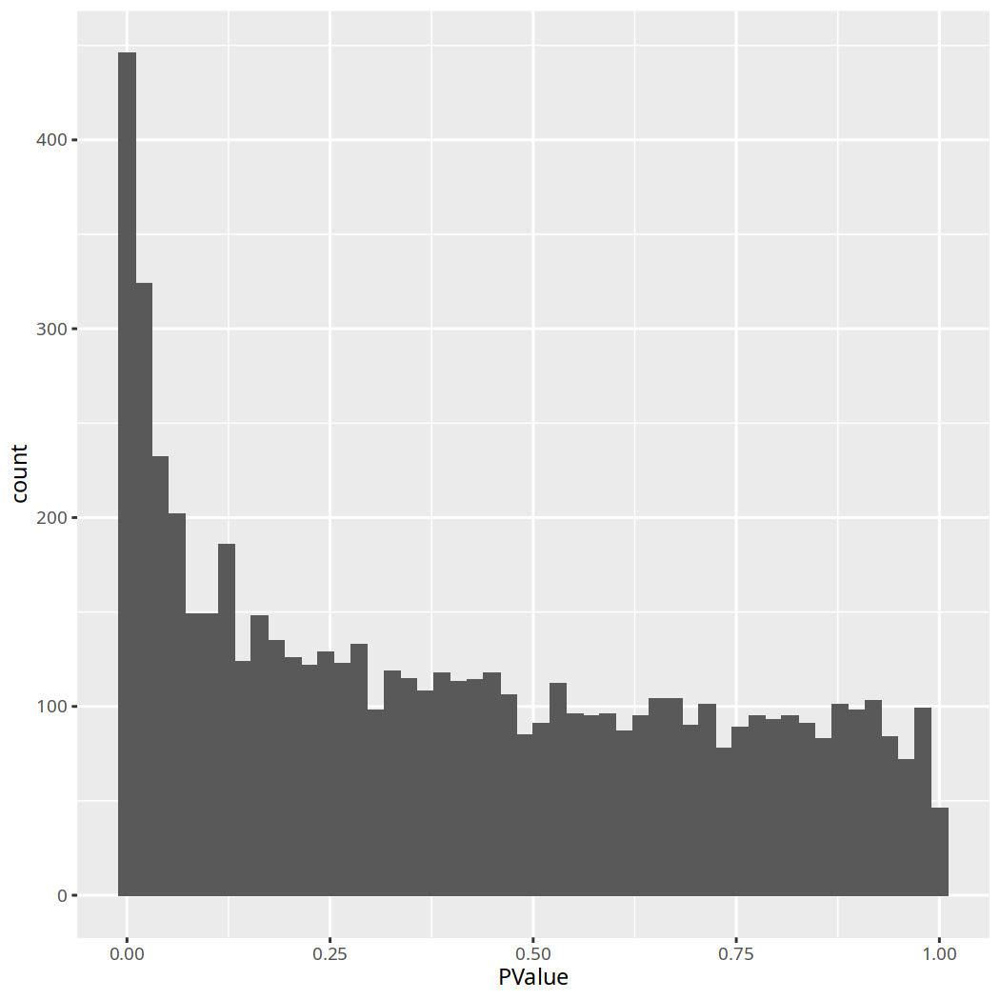

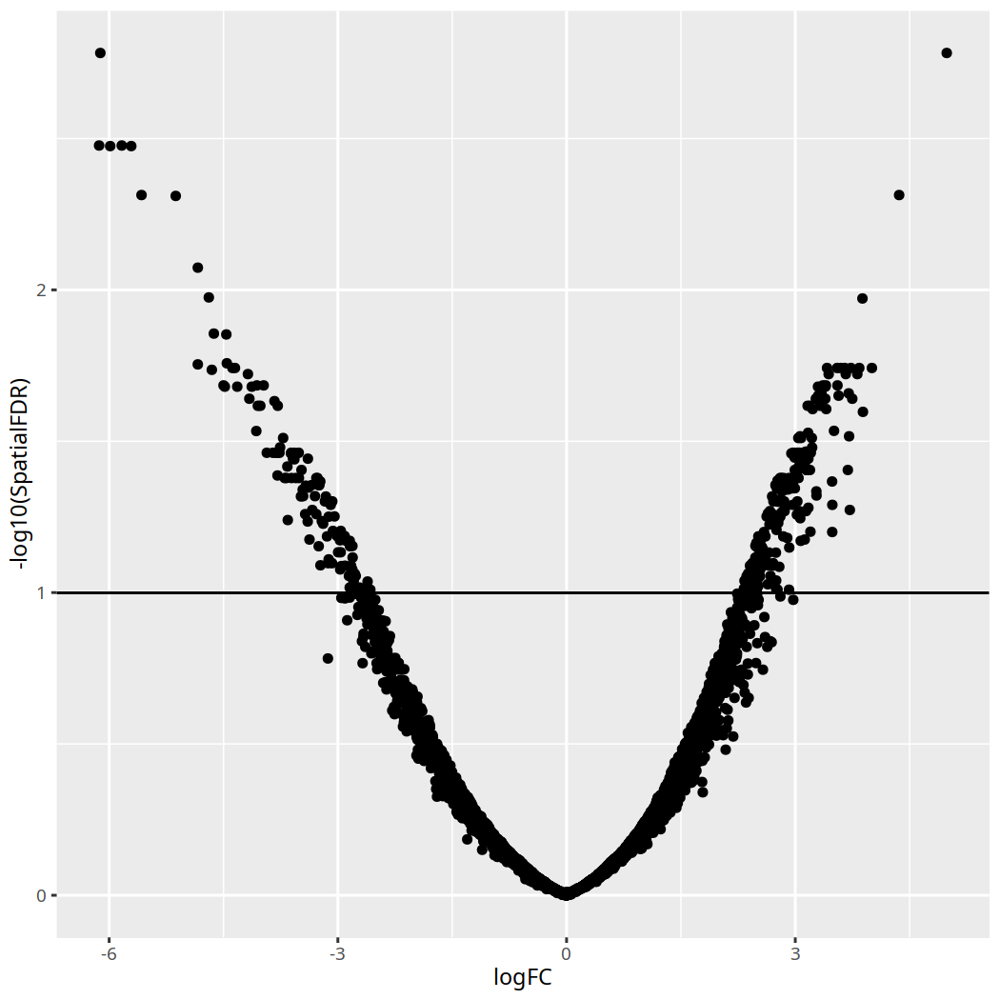

In [68]:
ggplot(da_results_age_vent, aes(PValue)) + geom_histogram(bins=50)
ggplot(da_results_age_vent, aes(logFC, -log10(SpatialFDR))) + 
  geom_point() +
  geom_hline(yintercept = 1) 

In [70]:
da_results_age_vent <- annotateNhoods(milo_obj, da_results_age_vent, coldata_col = "annotation_level1")
head(da_results_age_vent)

Converting annotation_level1 to factor...



,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR,annotation_level1,annotation_level1_fraction
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
1,0.39863652,8.754262,0.215413185,0.64255826,0.8743066,1,0.8745439,MF-I,0.8636364
2,0.04985032,8.560162,0.004126440,0.94878134,0.9836844,2,0.9834655,MF-I,0.7089552
3,-0.05100935,7.960459,0.004122565,0.94880536,0.9836844,3,0.9834655,MF-I,0.9651163
4,0.75473483,8.473609,0.827407431,0.36302538,0.7177060,4,0.7208083,MF-I,0.9847328
5,1.94718468,7.697564,5.049651691,0.02463298,0.2173340,5,0.2206732,MF-I,0.7857143
6,0.48024851,7.759791,0.267101334,0.60528398,0.8567394,6,0.8567986,MF-II,0.5466667


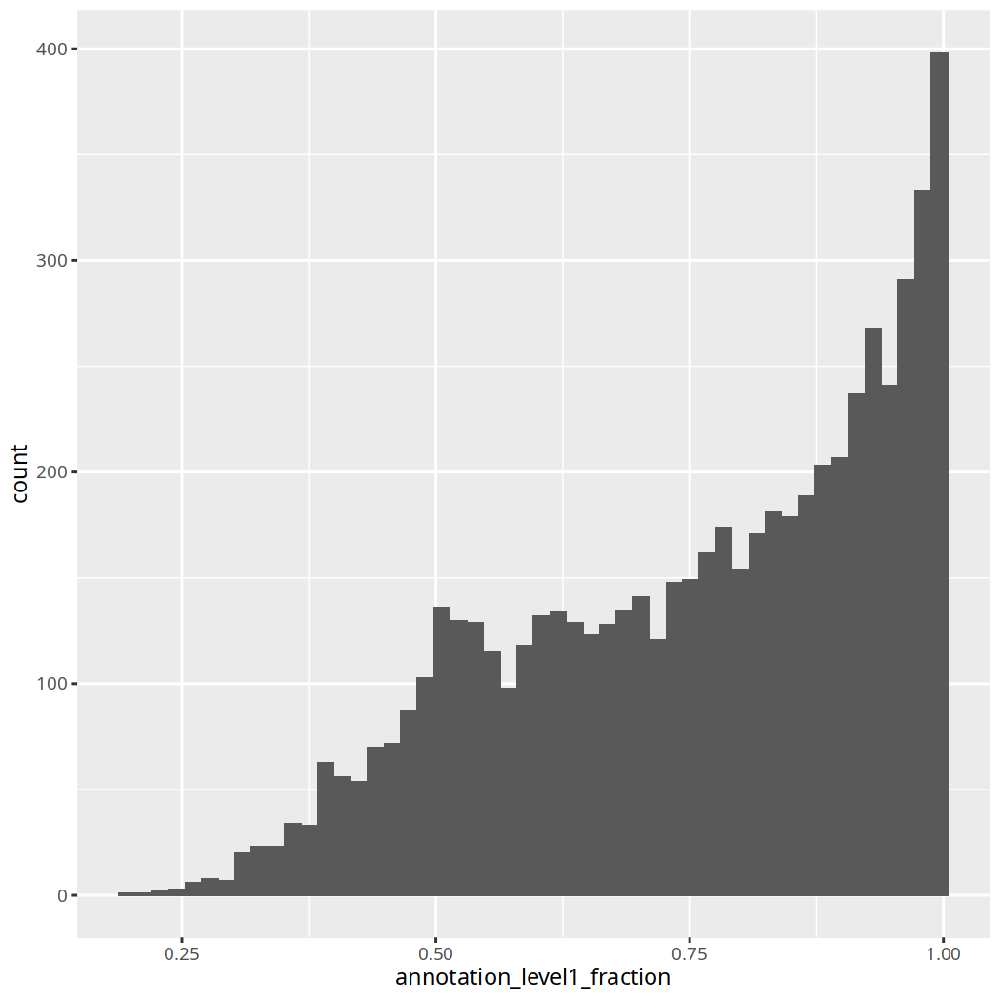

In [71]:
ggplot(da_results_age_vent, aes(annotation_level1_fraction)) + geom_histogram(bins=50)
da_results_age_vent$annotation_level1_clean_nhs <- ifelse(da_results_age_vent$annotation_level1_fraction < 0.7, "Mixed", da_results_age_vent$annotation_level1)

In [72]:
da_results_age_vent$annotation_level1_clean_nhs = factor(da_results_age_vent$annotation_level1_clean_nhs, 
 levels = ctype_order_lev1)

In [73]:
da_results_age_vent %>%
  arrange(SpatialFDR) %>%
  head() 

,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR,annotation_level1,annotation_level1_fraction,annotation_level1_clean_nhs
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<fct>
2832,4.986770,8.078960,25.22155,5.119217e-07,0.001566481,2832,0.001649602,I-OTU+TNF+,0.6774194,Mixed
5328,-6.115689,8.336357,25.51474,4.397575e-07,0.001566481,5328,0.001649602,I-FAM,0.8125000,I-FAM
3658,-5.834714,8.201242,22.44288,2.167719e-06,0.003316609,3658,0.003334903,MF-Isn(fg),0.9780220,MF-Isn(fg)
4172,-6.131751,8.431544,22.91206,1.698166e-06,0.003316609,4172,0.003334903,MF-Isn(fg),0.9915254,MF-Isn(fg)
1698,-5.710134,8.761999,21.64969,3.276658e-06,0.003342191,1698,0.003349370,I-FAM,0.9218750,I-FAM
1871,-5.986324,8.332929,21.84204,2.964118e-06,0.003342191,1871,0.003349370,I-OTU+TNF+,1.0000000,I-OTU+TNF+


Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


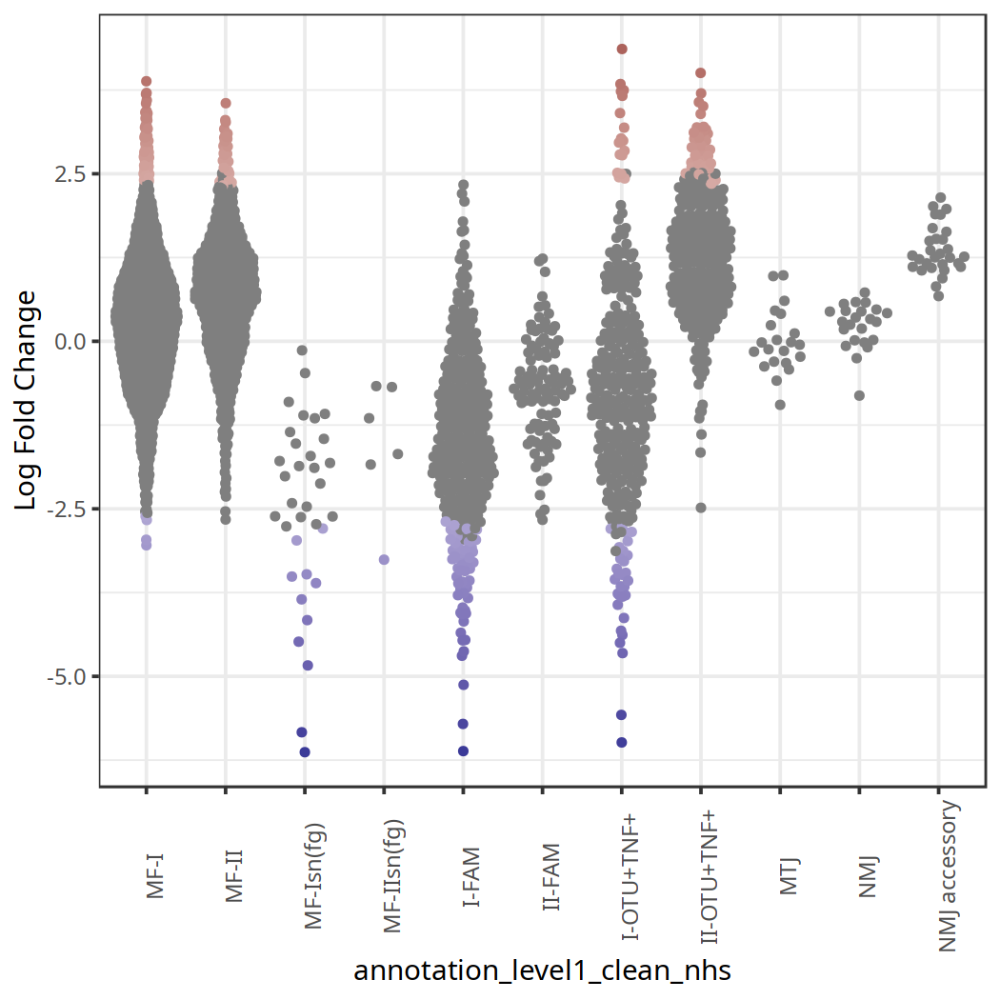

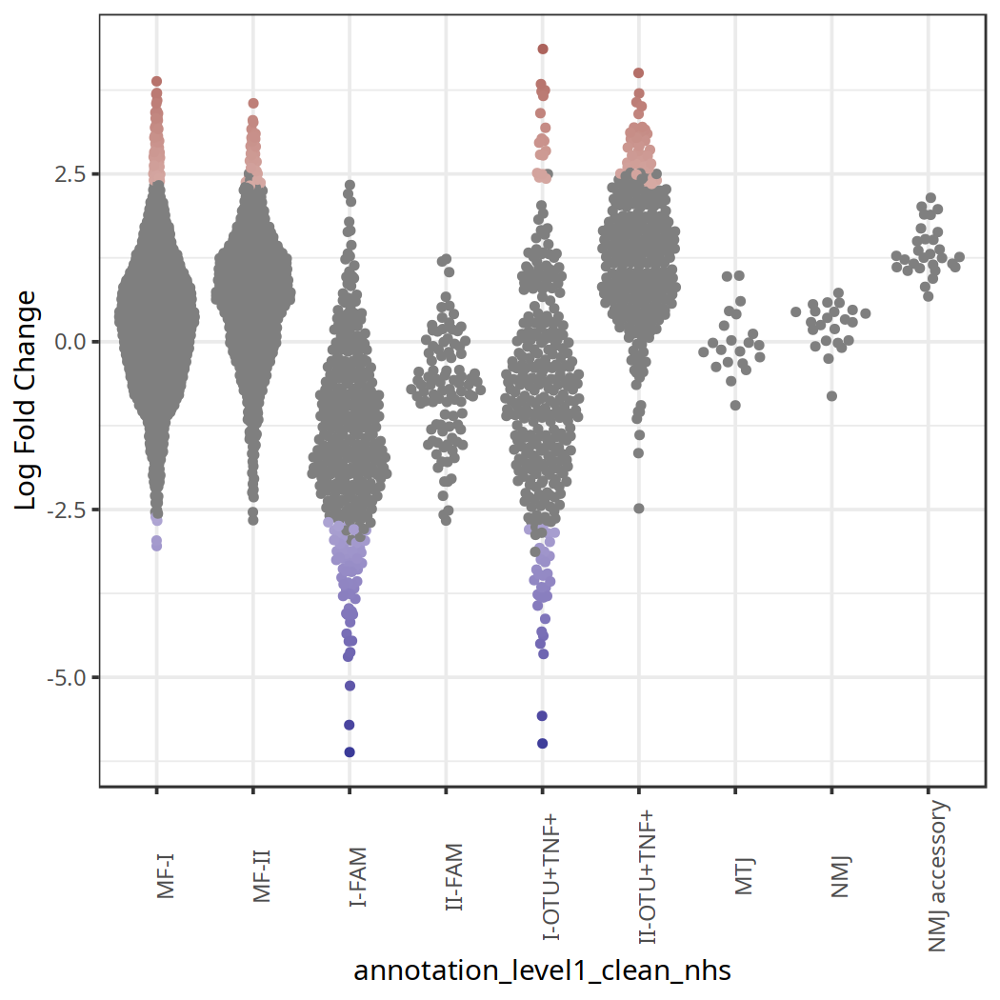

In [74]:
difab_plot = plotDAbeeswarm(da_results_age_vent, subset.nhoods = da_results_age_vent$annotation_level1_clean_nhs!='Mixed', group.by ="annotation_level1_clean_nhs") +scale_color_gradient2(low = muted("blue"), high = muted("red"))
difab_plot
difab_plot_rm = plotDAbeeswarm(da_results_age_vent, subset.nhoods = !(da_results_age_vent$annotation_level1_clean_nhs %in% c("MF-Isn(fg)", "MF-IIsn(fg)", 'Mixed')), group.by ="annotation_level1_clean_nhs") +scale_color_gradient2(low = muted("blue"), high = muted("red")) 
difab_plot_rm
#ggsave(filename = "~/muscle_ageing/results/Figures/v2_3_rm_343B_samples_atlas_Dif_abundance_myonuclei_filt.pdf", plot = difab_plot_rm, width = 6, height = 5)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


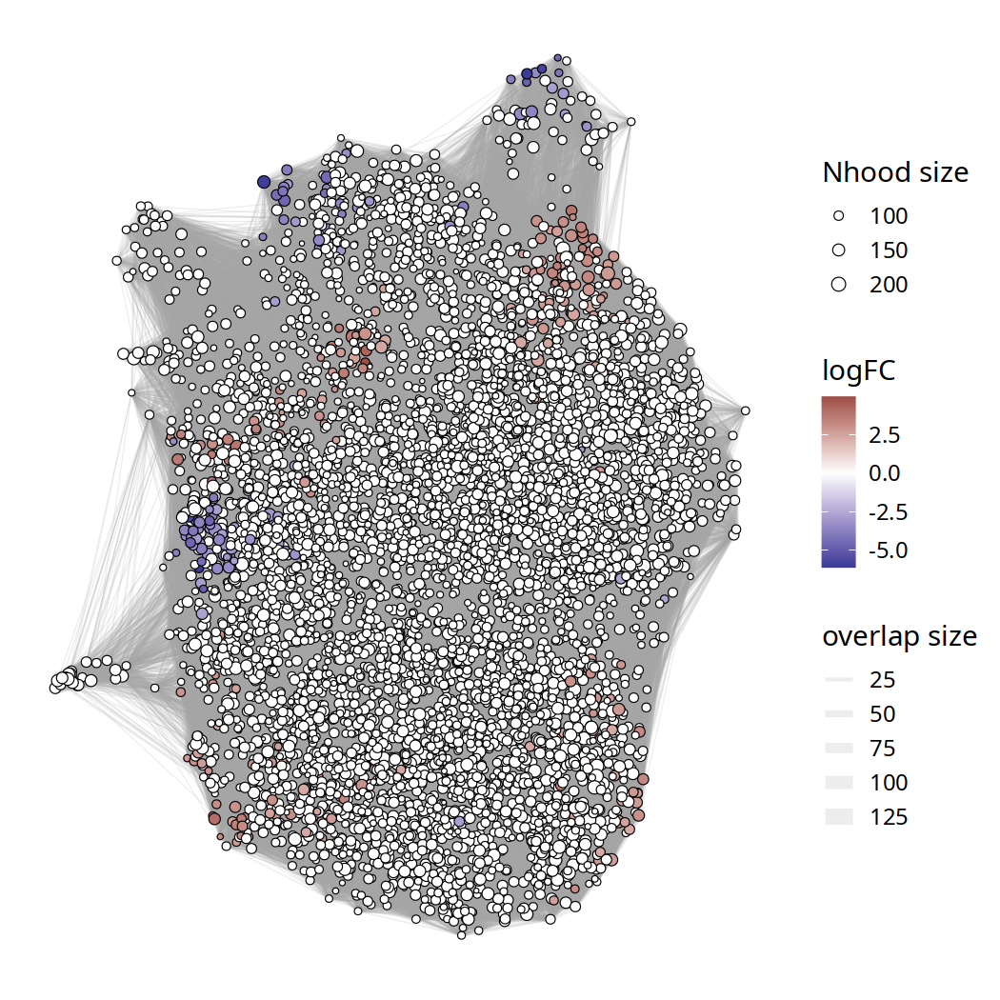

In [75]:
nh_graph_pl1 <- plotNhoodGraphDA(milo_obj, da_results_age_vent, layout="UMAP",alpha=0.1) + 
scale_fill_gradient2(name = "logFC", low = muted("blue"), high = muted("red")) 
nh_graph_pl1